In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import healpy as hp
from healpy.visufunc import projplot
from astropy.io import fits
from astropy.table import Table
from astropy.coordinates import SkyCoord, angular_separation, Angle
import astropy.units as u
import os
import sys
sys.path.insert(0, '/home/aew492/lss-dipoles')
import tools
from Secrest_dipole import SecrestDipole
import dipole

In [3]:
plt.rcParams.update({
    'text.usetex' : False,
    'font.family' : 'serif'
})

In [4]:
def angletoCMB(dipole):
    if dipole.ndim == 1:
        angle = angular_separation((dipole[1] * u.deg).to(u.rad),
                   (dipole[2] * u.deg).to(u.rad),
                   (cmb_dir.l).to(u.rad),
                   (cmb_dir.b).to(u.rad)).to(u.deg)
    else:
        assert dipole.ndim == 2
        angle = angular_separation((dipole[:,1] * u.deg).to(u.rad),
                   (dipole[:,2] * u.deg).to(u.rad),
                   (cmb_dir.l).to(u.rad),
                   (cmb_dir.b).to(u.rad)).to(u.deg)
    return angle

## CatWISE

In [5]:
# Catwise AGNs
catwise_kwargs = dict(initial_catfn='catwise_agns_master.fits',
                      catname='catwise_agns', mag='w1', load_init=False)

### galactic plane cuts

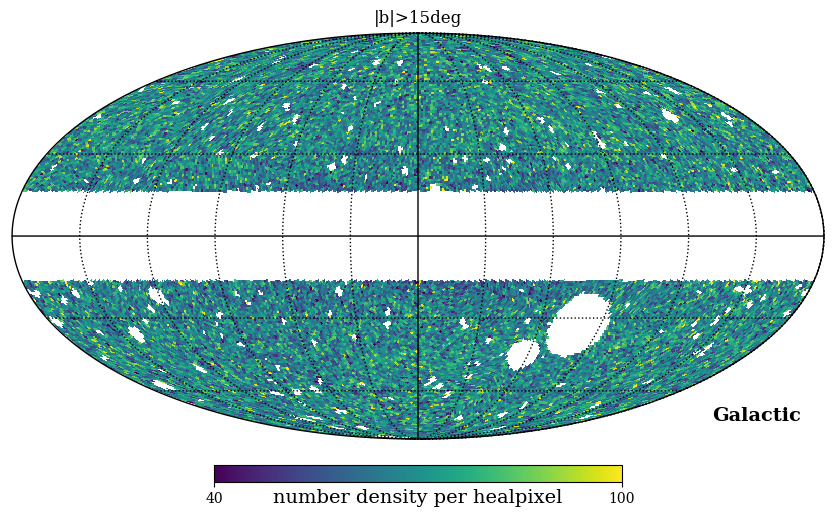

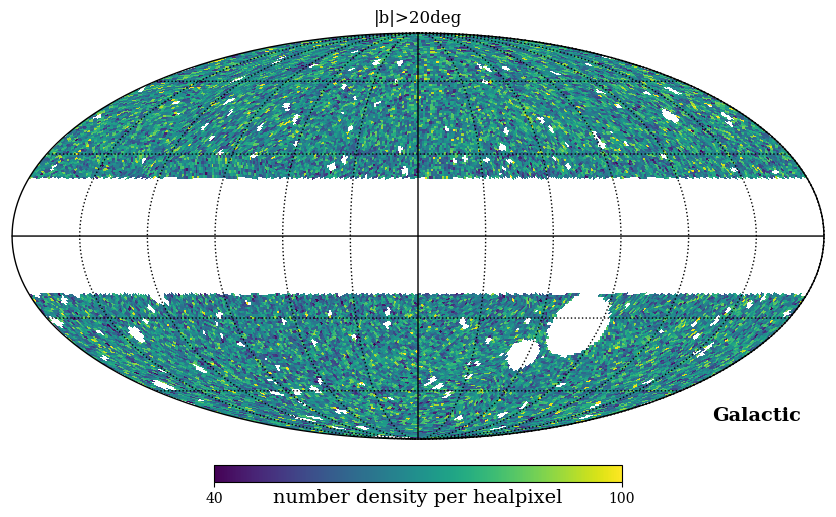

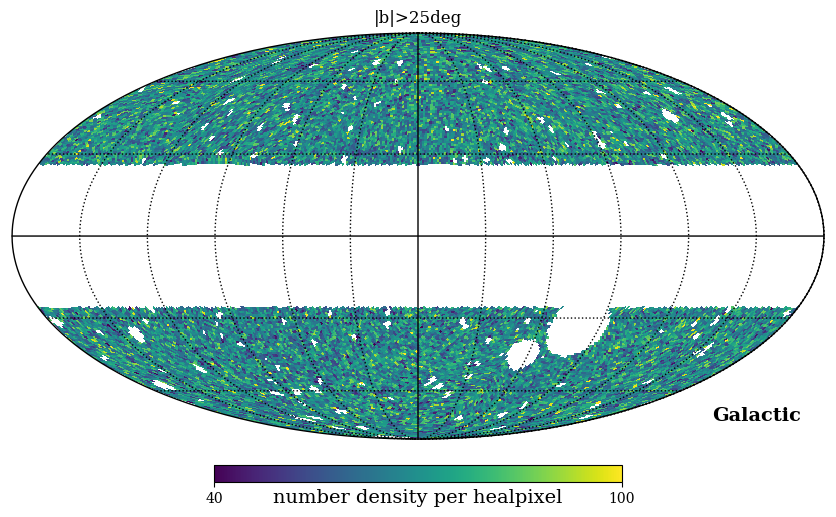

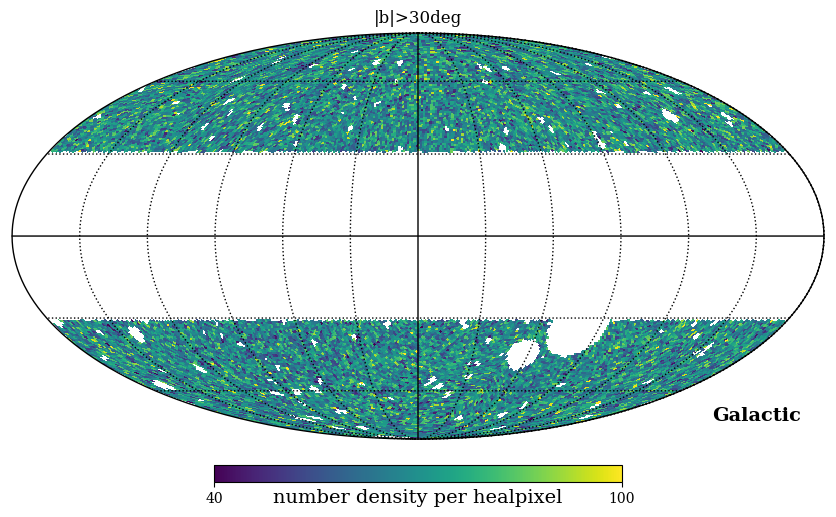

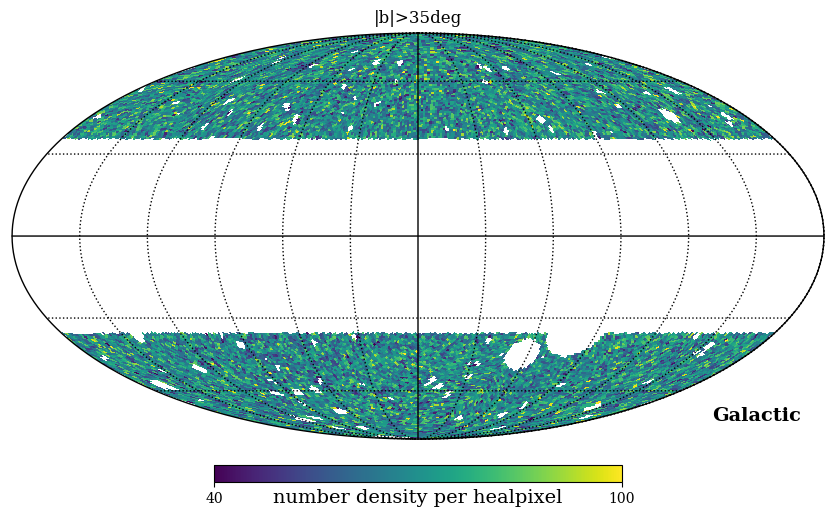

...

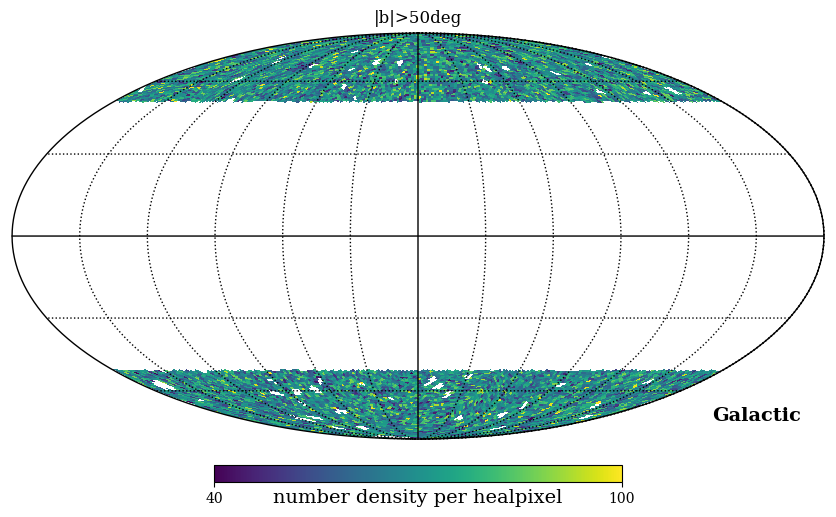

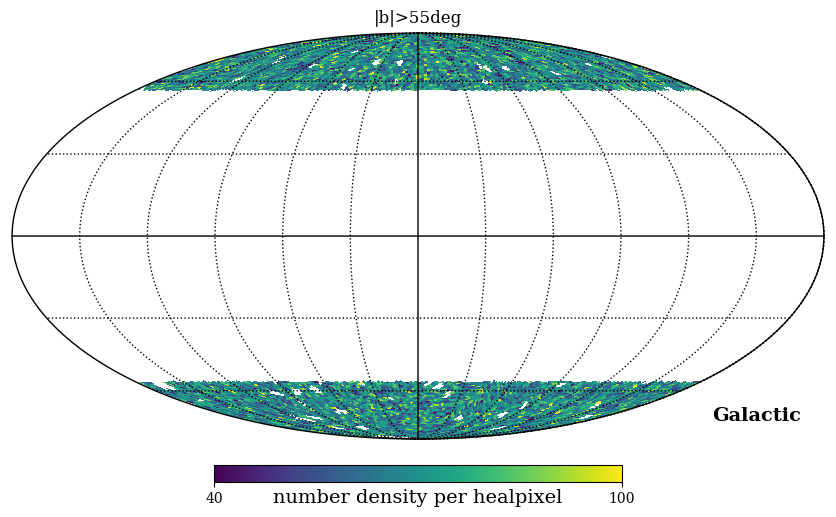

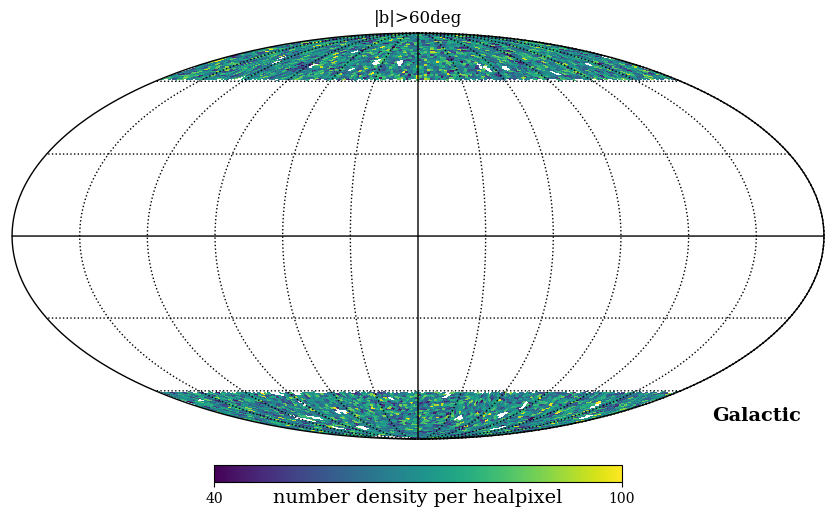

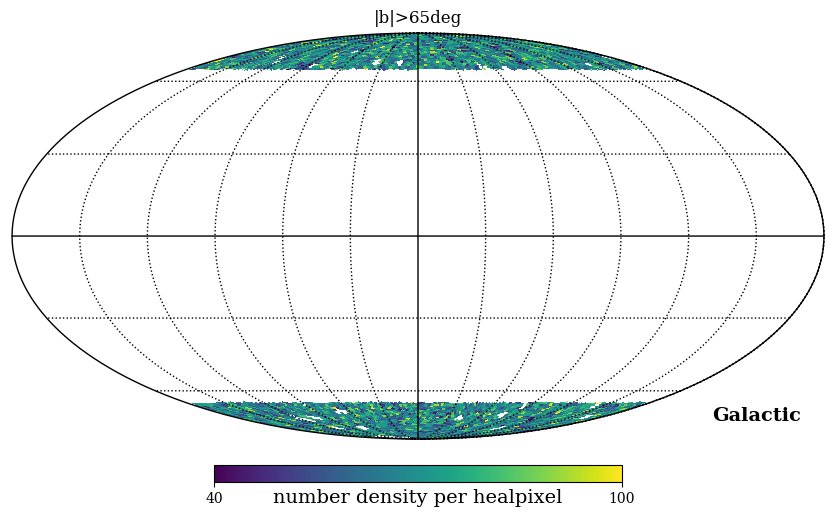

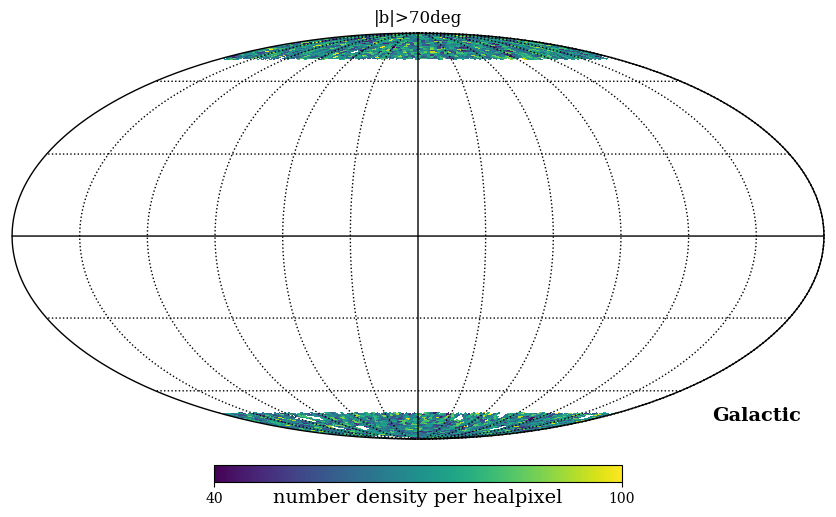

In [6]:
blims = np.arange(15, 71, 5)
dipoles_bcut = []
for i, blim in enumerate(blims):
    d = SecrestDipole(blim=blim, save_tag='', maglim=16.4, **catwise_kwargs)
    map_ = d.load_hpxelatcorr()
    d.plot_map(map_, min=40, max=100, title=f'|b|>{blim}deg')
    dipoles_bcut.append(d.compute_dipole(map_))

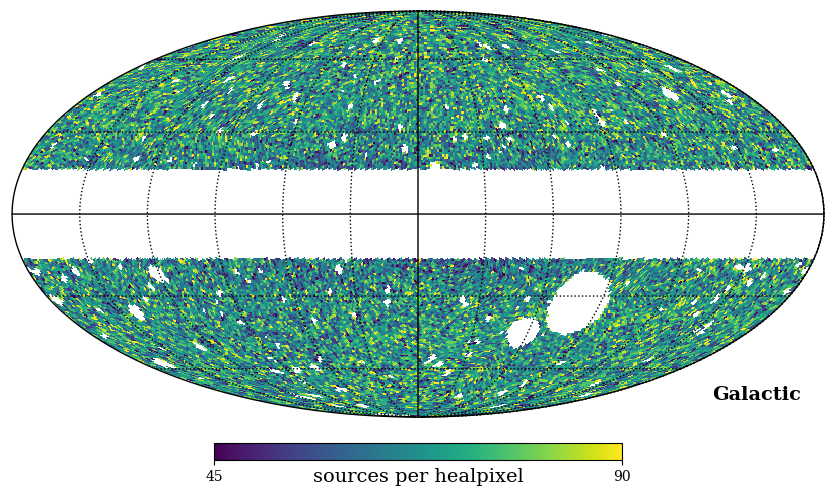

In [7]:
# nice plot of fiducial catalog
d = SecrestDipole(blim=15, save_tag='', maglim=16.4, **catwise_kwargs)
map_ = np.empty(49152)
map_[:] = np.nan
tab = d.load_hpxelatcorr()
map_[tab['hpidx']] = tab['elatdenscorr']
hp.mollview(map_, coord=['C','G'], min=45, max=90, badcolor='w', title='', unit='sources per healpixel')
hp.graticule()

### masking

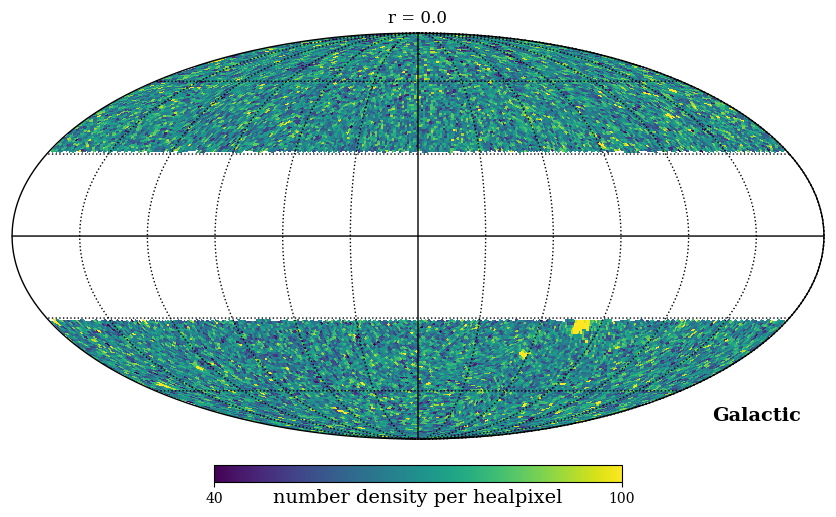

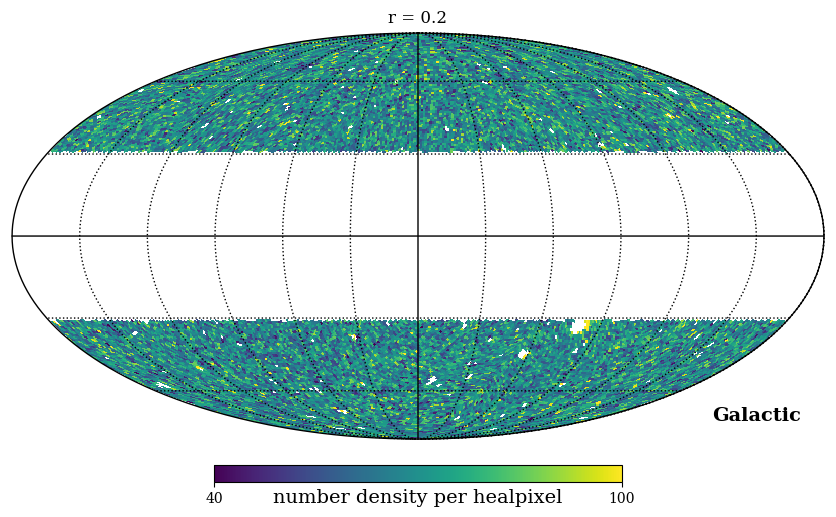

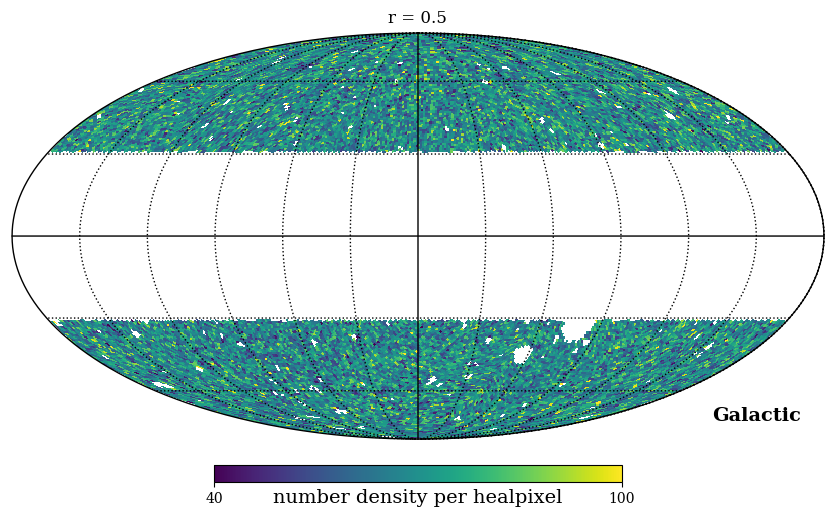

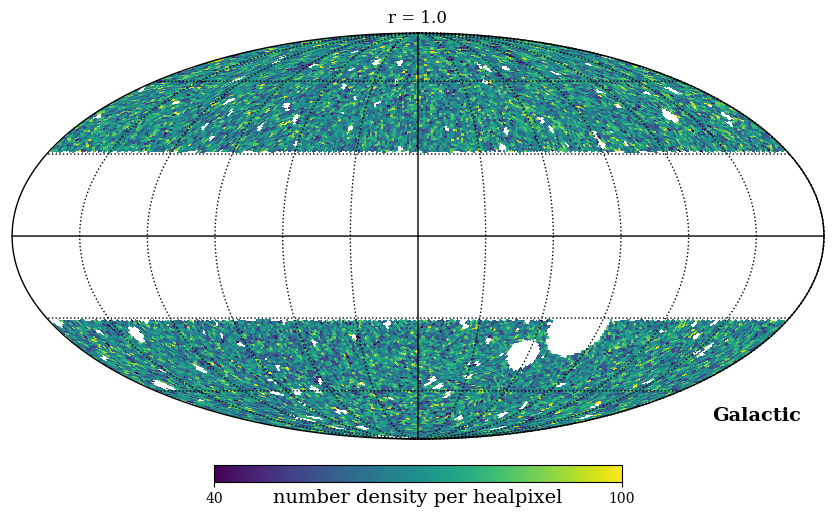

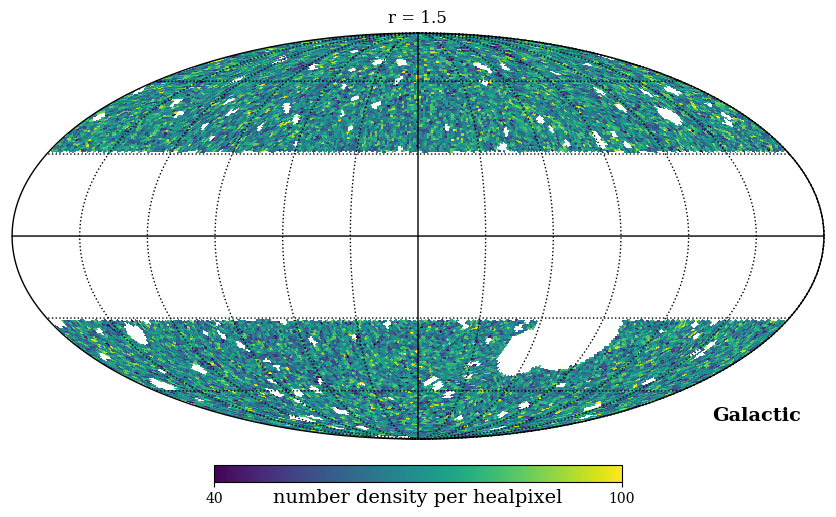

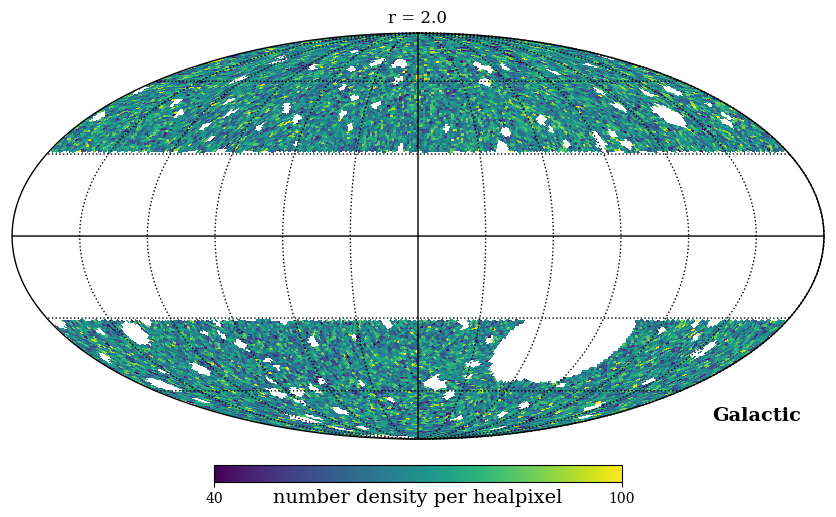

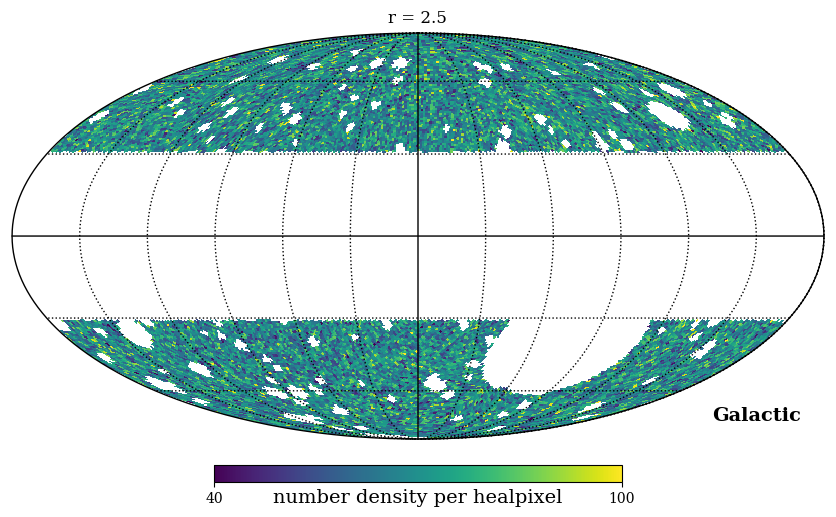

In [8]:
factors = np.array([0., 0.2, 0.5, 1., 1.5, 2., 2.5])
dipoles_masks = []
for i, factor in enumerate(factors):
    save_tag = f'_r{factor:.1f}'
    d = SecrestDipole(save_tag=save_tag, maglim=16.4, **catwise_kwargs)
    map_ = d.load_hpxelatcorr()
    d.plot_map(map_, min=40, max=100, title=f'r = {factor}')
    dipoles_masks.append(d.compute_dipole(map_))

### magnitude limits

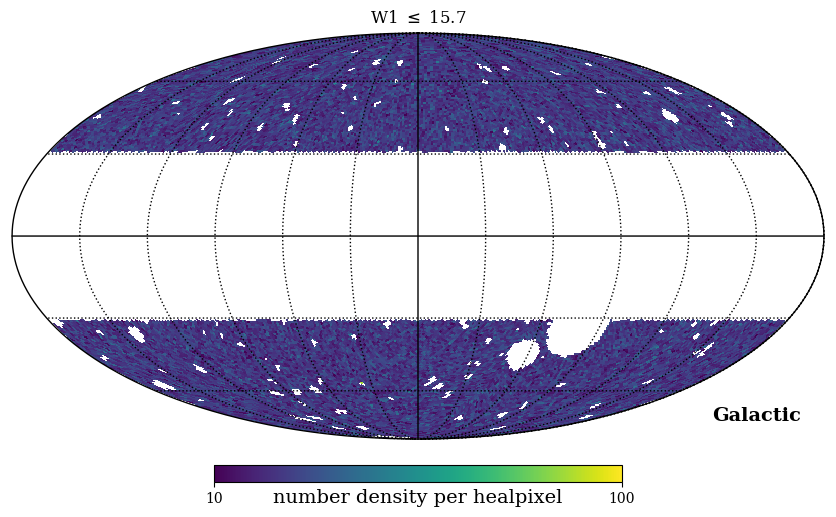

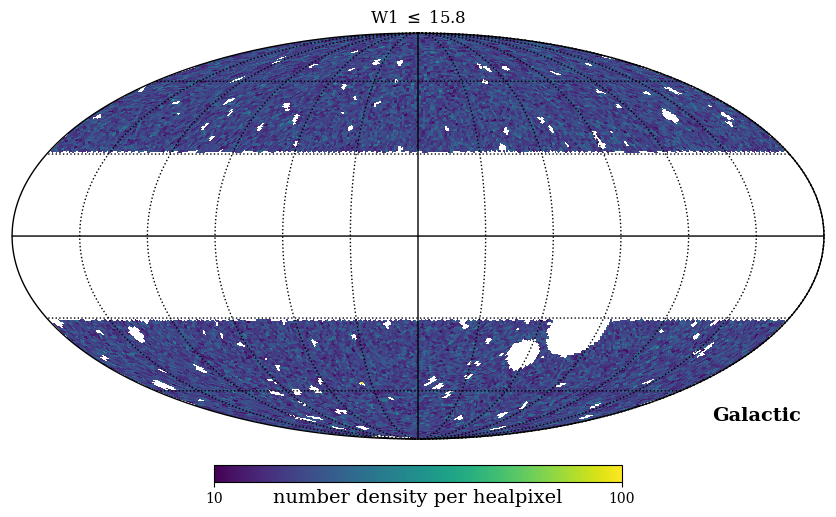

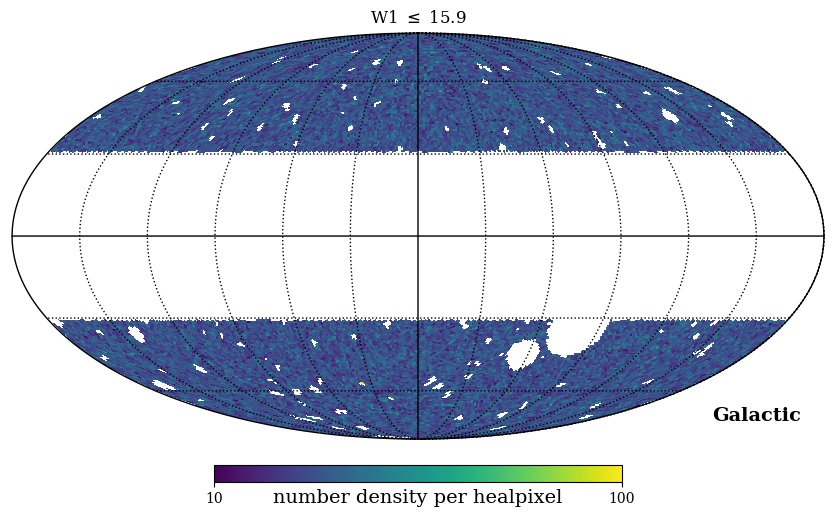

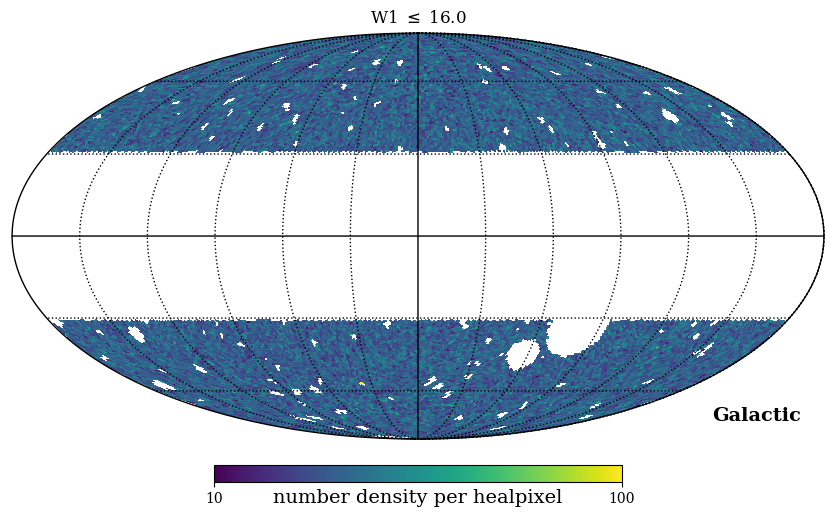

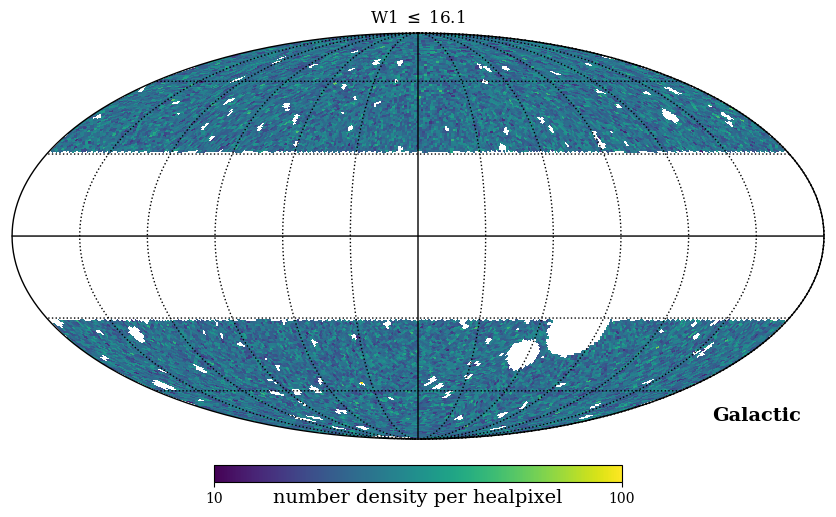

...

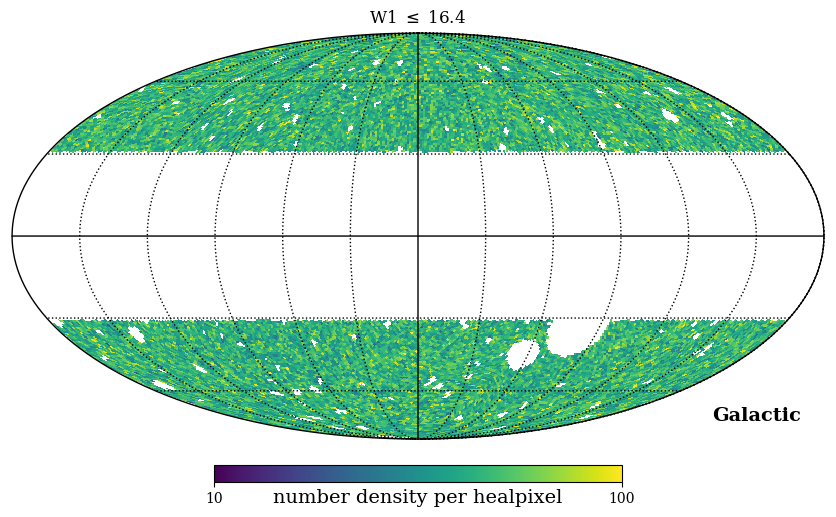

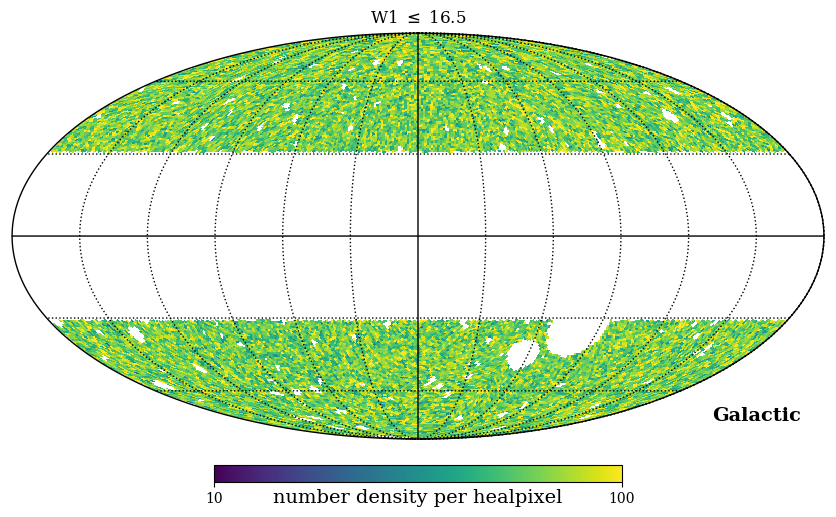

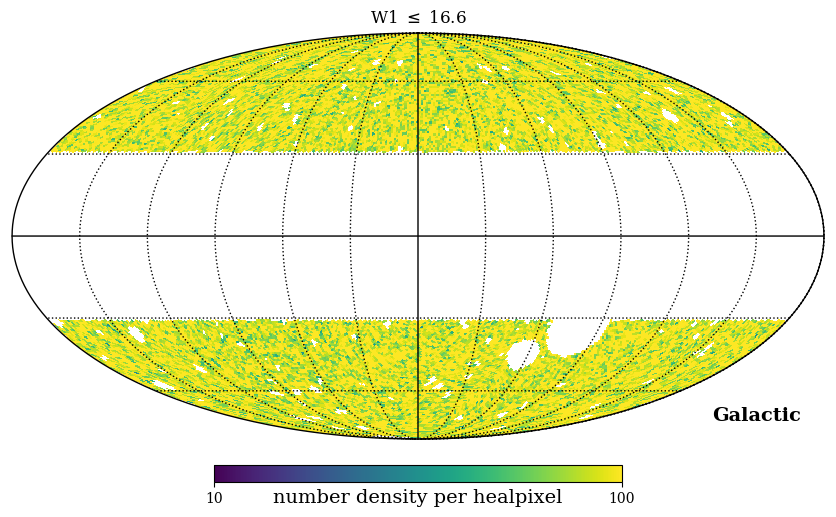

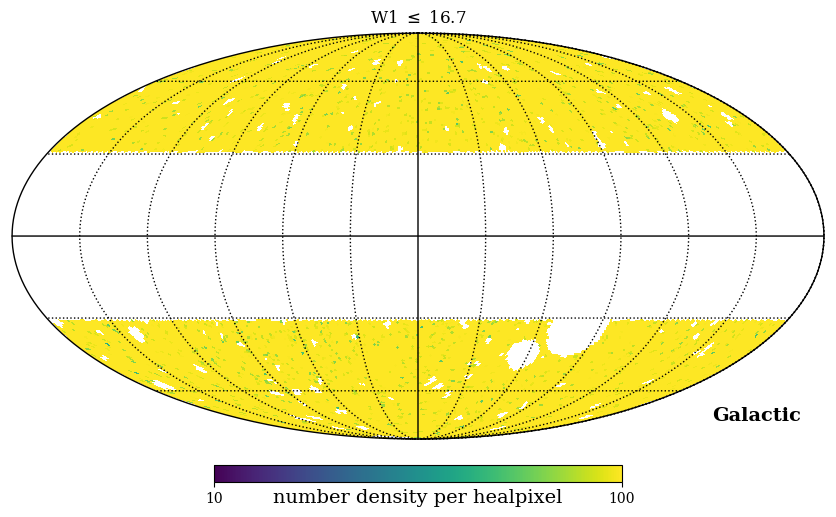

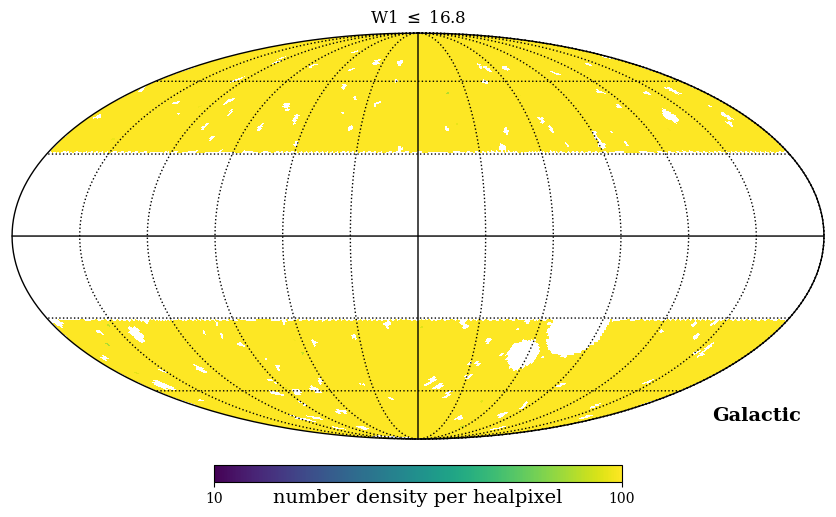

In [9]:
maglims = np.arange(15.7, 16.81, 0.1)
dipoles_maglims = []
for i, maglim in enumerate(maglims):
    d = SecrestDipole(maglim=maglim, **catwise_kwargs)
    map_ = d.load_hpxelatcorr()
    d.plot_map(map_, title=f'W1 $\leq$ {maglim:.1f}', min=10, max=100)
    dipoles_maglims.append(d.compute_dipole(map_))

### cmb dipole

In [10]:
cmb_amp, cmb_dir = dipole.cmb_dipole(frame='galactic')

### plot

In [11]:
b_smap = mpl.cm.ScalarMappable(cmap='Blues',norm = mpl.colors.Normalize(vmin=min(blims), vmax=max(blims)))
# delRW_smap = mpl.cm.ScalarMappable(cmap='cool',norm = mpl.colors.Normalize(vmin=min(delRWs), vmax=max(delRWs)))
r_smap = mpl.cm.ScalarMappable(cmap='Reds',norm = mpl.colors.Normalize(vmin=min(factors), vmax=max(factors)))
w1_smap = mpl.cm.ScalarMappable(cmap='Greens',norm = mpl.colors.Normalize(vmin=min(maglims), vmax=max(maglims)))

In [12]:
dips_b = np.array([
    [x[0], x[1].l.deg, x[1].b.deg] for x in dipoles_bcut
])
# dips_RW = np.array([
#     [x[0], x[1].l.deg, x[1].b.deg] for x in dipoles_delRW
# ])
dips_masks = np.array([
    [x[0], x[1].l.deg, x[1].b.deg] for x in dipoles_masks
])
dips_maglims = np.array([
    [x[0], x[1].l.deg, x[1].b.deg] for x in dipoles_maglims
])

In [13]:
# S21 / catwise fiducial
i_fid = np.where(blims==30.)[0]
S21_fid = dips_b[i_fid].flatten()

In [14]:
S21_fid

array([1.49890798e-02, 2.40298518e+02, 2.89572906e+01])

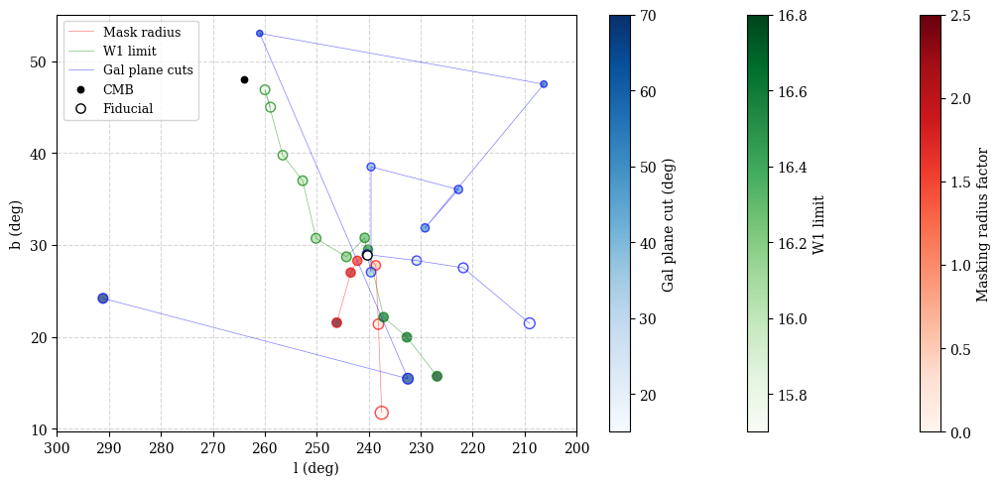

In [15]:
fig, ax = plt.subplots(figsize=(11,5))

line_kwargs = dict(alpha=0.5, lw=0.5)
kwargs = dict(marker='o', alpha=0.7) # color='w', markerfacecolor='None')
a = 3000
# RW
# ax.plot(dips_RW[:,1], dips_RW[:,2], alpha=0.5, color='b') # b_smap.to_rgba(blims[i]))
# for x in dips_RW:
#     ax.plot(x[1], x[2], marker='o', ms=500*x[0], alpha=0.8, color='b')

# mask radii
ax.plot(dips_masks[:,1], dips_masks[:,2], c='r', label='Mask radius', **line_kwargs) # b_smap.to_rgba(blims[i]))
rim = ax.scatter(dips_masks[:,1], dips_masks[:,2], s=a*dips_masks[:,0], c=r_smap.to_rgba(factors),
           edgecolors='r', **kwargs)

# magnitude limit
ax.plot(dips_maglims[:,1], dips_maglims[:,2], c='g', label='W1 limit', **line_kwargs) # b_smap.to_rgba(blims[i]))
w1im = ax.scatter(dips_maglims[:,1], dips_maglims[:,2], s=a*dips_maglims[:,0], c=w1_smap.to_rgba(maglims),
           edgecolors='g', **kwargs)
# galactic plane
ax.plot(dips_b[:,1], dips_b[:,2], c='b', label='Gal plane cuts', **line_kwargs) # b_smap.to_rgba(blims[i]))
bim = ax.scatter(dips_b[:,1], dips_b[:,2], s=a*dips_b[:,0], c=b_smap.to_rgba(blims), edgecolors='b', **kwargs)

# CMB
ax.scatter(cmb_dir.l.deg, cmb_dir.b.deg, marker='o', ls='None', s=a*0.007, alpha=1., c='k', edgecolors='k',
           zorder=11, label='CMB')
# fiducial
ax.scatter(S21_fid[1], S21_fid[2], c='w', marker='o', edgecolors='k', s=a*S21_fid[0], zorder=10, label='Fiducial')

ax.grid(alpha=0.5, ls='--')
ax.invert_xaxis()
xticks = np.arange(200,301,10)
ax.set_xticks(xticks)
# ax.set_xticklabels(xticks[::-1])
ax.set_xlabel('l (deg)')
ax.set_ylabel('b (deg)')
# ax.set_title('catwise spider')
ax.legend(loc=0, fontsize=9)
fig.colorbar(r_smap, ax=ax, label='Masking radius factor')
fig.colorbar(w1_smap, ax=ax, label='W1 limit')
fig.colorbar(b_smap, ax=ax, label='Gal plane cut (deg)')
fig.tight_layout()

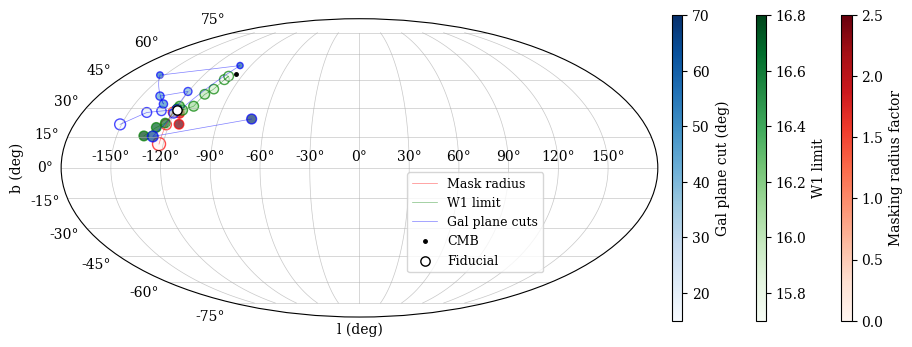

In [56]:
# sky plot
fig = plt.figure(figsize=(10,5))
ax = plt.subplot(111, projection='mollweide')

line_kwargs = dict(alpha=0.5, lw=0.5, marker='None')
kwargs = dict(marker='o', alpha=0.7) # color='w', markerfacecolor='None')
a = 3000

# mask radii
ax.plot(Angle(dips_masks[:,1], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
        Angle(dips_masks[:,2], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
        c='r', label='Mask radius', **line_kwargs)
rim = ax.scatter(Angle(dips_masks[:,1], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
                 Angle(dips_masks[:,2], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
                 s=a*dips_masks[:,0], c=r_smap.to_rgba(factors), edgecolors='r', **kwargs)

# magnitude limit
ax.plot(Angle(dips_maglims[:,1], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
        Angle(dips_maglims[:,2], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
        c='g', label='W1 limit', **line_kwargs)
w1im = ax.scatter(Angle(dips_maglims[:,1], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
                  Angle(dips_maglims[:,2], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
                  s=a*dips_maglims[:,0], c=w1_smap.to_rgba(maglims), edgecolors='g', **kwargs)
# galactic plane
ax.plot(Angle(dips_b[:,1], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
        Angle(dips_b[:,2], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
        c='b', label='Gal plane cuts', **line_kwargs)
bim = ax.scatter(Angle(dips_b[:,1], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
                 Angle(dips_b[:,2], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
                 s=a*dips_b[:,0], c=b_smap.to_rgba(blims), edgecolors='b', **kwargs)

# CMB
ax.plot(Angle(cmb_dir.l, unit=u.rad).wrap_at(np.pi*u.rad),
        Angle(cmb_dir.b, unit=u.rad).wrap_at(np.pi*u.rad),
        marker='o', ls='None', ms=500*0.005, alpha=1., c='k', zorder=11, label='CMB')
# S21 fiducial
ax.scatter(Angle(S21_fid[1]*u.deg).to(u.rad).wrap_at(np.pi*u.rad),
           Angle(S21_fid[2]*u.deg).to(u.rad).wrap_at(np.pi*u.rad),
           marker='o', c='w', edgecolors='k', s=a*S21_fid[0], zorder=10, label='Fiducial')

ax.set_xlabel('l (deg)')
ax.set_ylabel('b (deg)')
ax.legend(loc=(.58,.15), fontsize=9)
cbar_kwargs = dict(shrink=0.65, aspect=30, fraction=.15)
fig.colorbar(r_smap, ax=ax, pad=-.04, label='Masking radius factor', **cbar_kwargs)
fig.colorbar(w1_smap, ax=ax, pad=-.03, label='W1 limit', **cbar_kwargs)
fig.colorbar(b_smap, ax=ax, pad=.02, label='Gal plane cut (deg)', **cbar_kwargs)
# ax.set_title('S21 recovered dipoles')
ax.grid(True, lw=0.5, alpha=0.7)
fig.tight_layout()

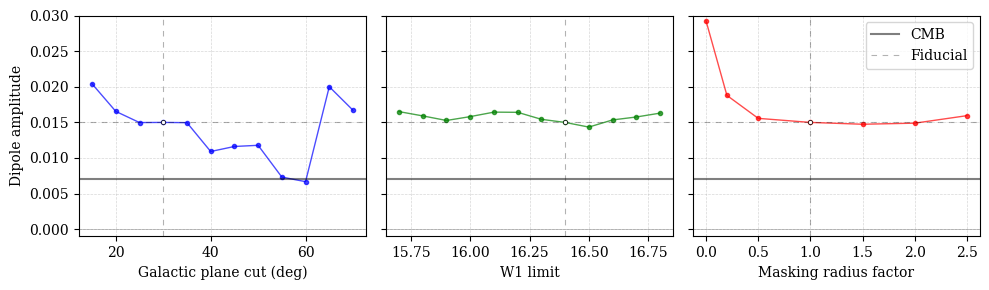

In [57]:
# amplitudes
fig, axs = plt.subplots(1, 3, figsize=(10,3))

kwargs = dict(lw=1, alpha=0.7, marker='.') # color='w', markerfacecolor='None')

# galactic plane
axs[0].plot(blims, dips_b[:,0], c='b', **kwargs)
axs[0].set_xlabel('Galactic plane cut (deg)')
axs[0].axvline(30, alpha=0.3, c='k', ls=(0,(5,5)), lw=0.8)
axs[0].plot(30, dips_b[:,0][blims==30], marker='.', c='w', mec='k', mew=0.5, zorder=10)
# magnitude limit
axs[1].plot(maglims, dips_maglims[:,0], c='g', **kwargs)
axs[1].set_xlabel('W1 limit')
axs[1].axvline(16.4, alpha=0.3, c='k', ls=(0,(5,5)), lw=0.8)
axs[1].plot(16.4, dips_maglims[:,0][maglims==16.4], marker='.', c='w', mec='k', mew=0.5, zorder=10)
# mask radii
axs[2].plot(factors, dips_masks[:,0], c='r', **kwargs)
axs[2].set_xlabel('Masking radius factor')
axs[2].axvline(1., alpha=0.3, c='k', ls=(0,(5,5)), lw=0.8)
axs[2].plot(1., dips_masks[:,0][factors==1.], marker='.', c='w', mec='k', mew=0.5, zorder=10)

# CMB and other formatting
for ax in axs:
    ax.grid(lw=0.5, alpha=0.5, ls='--')
    ax.axhline(0.007, c='k', label='CMB', alpha=0.5, lw=1.5)
    ax.set_ylim(-.001, 0.03)
    ax.axhline(0, alpha=0.3, color='k', lw=0.5)
    ax.axhline(S21_fid[0], alpha=0.3, c='k', ls=(0,(5,5)), lw=0.8, label='Fiducial')
for ax in axs[1:]:
    ax.set_yticklabels([])
axs[0].set_ylabel('Dipole amplitude')
axs[-1].legend()
fig.tight_layout()

### angle to CMB

In [58]:
angles_blims = angletoCMB(dips_b)
angles_maglims = angletoCMB(dips_maglims)
angles_masks = angletoCMB(dips_masks)

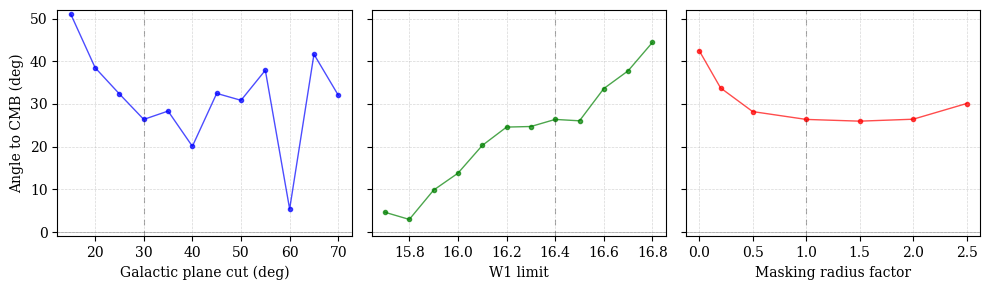

In [59]:
# amplitudes
fig, axs = plt.subplots(1, 3, figsize=(10,3))

kwargs = dict(lw=1, alpha=0.7, marker='.')

# galactic plane
axs[0].plot(blims, angles_blims, c='b', **kwargs)
axs[0].set_xlabel('Galactic plane cut (deg)')
axs[0].axvline(30, alpha=0.3, c='k', ls=(0,(5,5)), lw=0.8)
# axs[0].plot(30, dips_b[:,0][blims==30], marker='.', c='w', mec='k', mew=0.5, zorder=10)
# magnitude limit
axs[1].plot(maglims, angles_maglims, c='g', **kwargs)
axs[1].set_xlabel('W1 limit')
axs[1].axvline(16.4, alpha=0.3, c='k', ls=(0,(5,5)), lw=0.8)
# axs[1].plot(16.4, dips_maglims[:,0][maglims==16.4], marker='.', c='w', mec='k', mew=0.5, zorder=10)
# mask radii
axs[2].plot(factors, angles_masks, c='r', **kwargs)
axs[2].set_xlabel('Masking radius factor')
axs[2].axvline(1., alpha=0.3, c='k', ls=(0,(5,5)), lw=0.8)
# axs[2].plot(1., dips_masks[:,0][factors==1.], marker='.', c='w', mec='k', mew=0.5, zorder=10)

# CMB and other formatting
for ax in axs:
    ax.grid(lw=0.5, alpha=0.5, ls='--')
    # ax.axhline(cmb_amp, c='k', label='CMB', alpha=0.5, lw=1.5)
    ax.set_ylim(-1, 52)
    ax.axhline(0, alpha=0.3, color='k', lw=0.5)
    # ax.axhline(S21_fid[0], alpha=0.3, c='k', ls=(0,(5,5)), lw=0.8, label='Fiducial')
for ax in axs[1:]:
    ax.set_yticklabels([])
axs[0].set_ylabel('Angle to CMB (deg)')
# axs[-1].legend()
fig.tight_layout()

### finer grid of plane cuts

In [60]:
res = np.load('/scratch/aew492/quasars/catalogs/catwise_agns/dipoles_blimgrid.npy', allow_pickle=True)
blims, dip_amps, dip_dirs = res.T
blims = blims.astype(float)
dip_amps = dip_amps.astype(float)
dip_dirs = np.array([
    (x.galactic.l.deg, x.galactic.b.deg) for x in dip_dirs
])
b_smap = mpl.cm.ScalarMappable(cmap='Blues',norm = mpl.colors.Normalize(vmin=min(blims), vmax=max(blims)))

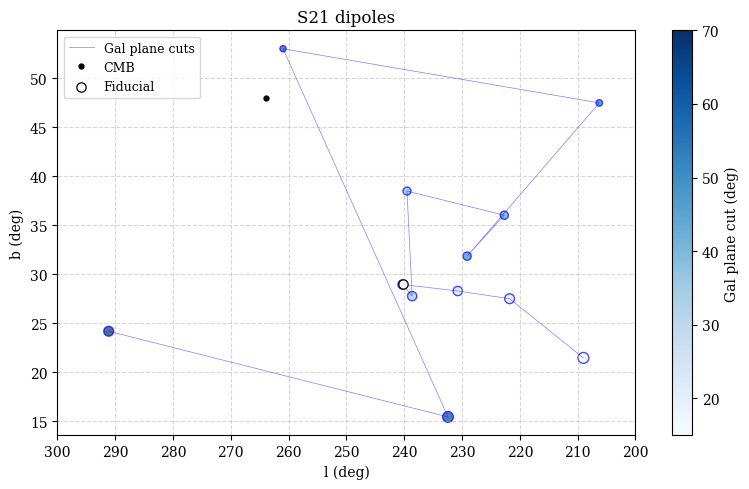

In [61]:
fig, ax = plt.subplots(figsize=(8,5))
kwargs = dict(marker='o', alpha=0.7)
ax.plot(dip_dirs[:,0], dip_dirs[:,1], c='b', label='Gal plane cuts', **line_kwargs)
bim = ax.scatter(dip_dirs[:,0], dip_dirs[:,1], s=a*dip_amps, c=b_smap.to_rgba(blims), edgecolors='b', **kwargs)

# CMB
ax.plot(cmb_dir.l.deg, cmb_dir.b.deg, marker='o', ls='None', ms=500*cmb_amp, alpha=1., c='k', zorder=11, label='CMB')
# S21 fiducial
ax.scatter(S21_fid[1], S21_fid[2], marker='o', c='w', alpha=0.9, edgecolors='k', s=a*S21_fid[0],
        zorder=10, label='Fiducial')

ax.grid(alpha=0.5, ls='--')
ax.invert_xaxis()
xticks = np.arange(200,301,10)
ax.set_xticks(xticks)
ax.set_xlabel('l (deg)')
ax.set_ylabel('b (deg)')
ax.legend(loc=0, fontsize=9)
fig.colorbar(b_smap, ax=ax, label='Gal plane cut (deg)')
ax.set_title('S21 dipoles')
fig.tight_layout()

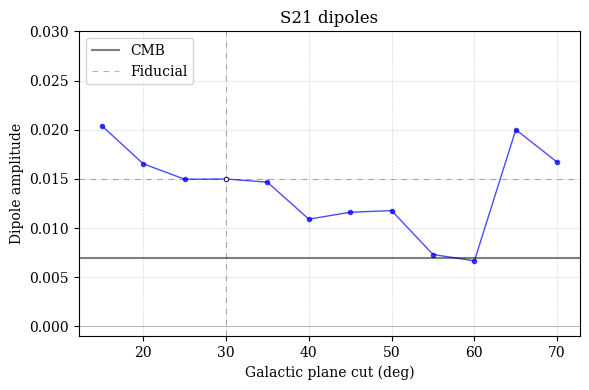

In [62]:
# amplitudes
fig, ax = plt.subplots(figsize=(6,4))

kwargs = dict(lw=1, alpha=0.7, marker='.') # color='w', markerfacecolor='None')

ax.plot(blims, dip_amps, c='b', **kwargs)
ax.set_xlabel('Galactic plane cut (deg)')
ax.axvline(30., alpha=0.3, c='k', ls=(0,(5,5)), lw=0.8)
ax.plot(30., dip_amps[blims==30.], marker='.', c='w', mec='k', mew=0.5, zorder=10)

ax.grid(lw=0.5, alpha=0.5, ls='--')
ax.axhline(cmb_amp, c='k', label='CMB', alpha=0.5, lw=1.5)
ax.set_ylabel('Dipole amplitude')
ax.set_ylim(-.001, 0.03)
ax.axhline(0, alpha=0.3, color='k', lw=0.5)
ax.axhline(dip_amps[blims==30.], alpha=0.3, c='k', ls=(0,(5,5)), lw=0.8, label='Fiducial')
ax.set_title('S21 dipoles')
ax.legend(loc=2)
fig.tight_layout()

In [63]:
# distance to cmb
angletoCMB(S21_fid)

<Quantity 26.37676821 deg>

## Quaia

In [64]:
quaia_kwargs = dict(initial_catfn='quaia_G20.0.fits',
                      catname='quaia', mag='G', load_init=False, compcorrect=True)

#### compare updated vs. old catalogs, G<20.0 vs. G<20.5

In [65]:
# Quaia "high": G<20.0
blims, dipamps, dipdirs = np.load('/scratch/aew492/quasars/catalogs/quaia/dipoles_blimgrid.npy', allow_pickle=True).T
dipamps = dipamps.astype(float)
dips_b = np.array([
    [dipamps[i], dipdirs[i].l.deg, dipdirs[i].b.deg] for i in range(len(blims))
])
blims, dipamps_old, dipdirs_old = np.load('/scratch/aew492/quasars/catalogs/quaia/old_dipoles_blimgrid.npy', allow_pickle=True).T
dipamps_old = dipamps_old.astype(float)
dips_b_old = np.array([
    [dipamps_old[i], dipdirs_old[i].l.deg, dipdirs_old[i].b.deg] for i in range(len(blims))
])
# Quaia "low": G<20.5
blims, dipamps_low, dipdirs_low = np.load('/scratch/aew492/quasars/catalogs/quaia/dipoles_blimgrid_G20.5.npy', allow_pickle=True).T
dipamps_low = dipamps_low.astype(float)
dips_b_low = np.array([
    [dipamps_low[i], dipdirs_low[i].l.deg, dipdirs_low[i].b.deg] for i in range(len(blims))
])
blims, dipamps_old_low, dipdirs_old_low = np.load('/scratch/aew492/quasars/catalogs/quaia/old_dipoles_blimgrid_G20.5.npy', allow_pickle=True).T
blims = blims.astype(float)
dipamps_old_low = dipamps_old_low.astype(float)
dips_b_old_low = np.array([
    [dipamps_old_low[i], dipdirs_old_low[i].l.deg, dipdirs_old_low[i].b.deg] for i in range(len(blims))
])

In [66]:
b_smap = mpl.cm.ScalarMappable(cmap='Blues', norm = mpl.colors.Normalize(vmin=min(blims), vmax=max(blims)))

In [67]:
b_smap = mpl.cm.ScalarMappable(cmap='Blues', norm = mpl.colors.Normalize(vmin=min(blims), vmax=max(blims)))
b_smap_old = mpl.cm.ScalarMappable(cmap='Greens', norm = mpl.colors.Normalize(vmin=min(blims), vmax=max(blims)))

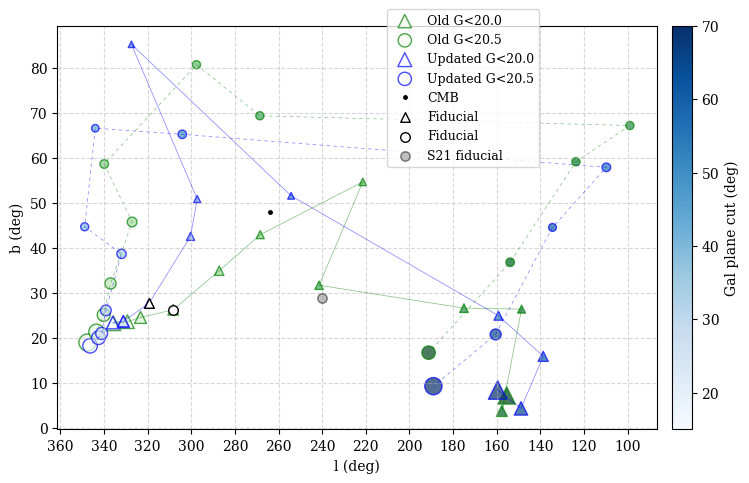

In [68]:
fig, ax = plt.subplots(figsize=(8,5))

kwargs = dict(alpha=0.7) # color='w', markerfacecolor='None')
a = 3000

# old
c = 'g'
ax.plot(dips_b_old[:,1], dips_b_old[:,2], c=c, **line_kwargs)
bim = ax.scatter(dips_b_old[:,1], dips_b_old[:,2], s=a*dips_b_old[:,0], marker='^',
                 c=b_smap_old.to_rgba(blims), edgecolors=c, label='Old G<20.0', **kwargs)
ax.plot(dips_b_old_low[:,1], dips_b_old_low[:,2], c=c, ls=(5,(5,5)), **line_kwargs)
bim = ax.scatter(dips_b_old_low[:,1], dips_b_old_low[:,2], s=a*dips_b_old_low[:,0], marker='o',
                 c=b_smap_old.to_rgba(blims), edgecolors=c, label='Old G<20.5', **kwargs)
ax.set_xticks(np.arange(100,361,20))

# updated
c = 'b'
ax.plot(dips_b[:,1], dips_b[:,2], c=c, **line_kwargs)
bim = ax.scatter(dips_b[:,1], dips_b[:,2], s=a*dips_b[:,0], marker='^',
                 c=b_smap.to_rgba(blims), edgecolors=c, label='Updated G<20.0', **kwargs)
ax.plot(dips_b_low[:,1], dips_b_low[:,2], c=c, ls=(5,(5,5)), **line_kwargs)
bim = ax.scatter(dips_b_low[:,1], dips_b_low[:,2], s=a*dips_b_old[:,0], marker='o',
                 c=b_smap.to_rgba(blims), edgecolors=c, label='Updated G<20.5', **kwargs)

# CMB
ax.plot(cmb_dir.l.deg, cmb_dir.b.deg, marker='o', ls='None', ms=500*0.005, alpha=1., c='k', zorder=11, label='CMB')
# Quaia fiducial
i_fid = np.where(blims==30.)[0]
ax.scatter(dips_b[i_fid,1], dips_b[i_fid,2], marker='^', c='w', edgecolors='k', s=a*dips_b[i_fid,0],
        zorder=10, label='Fiducial')
ax.scatter(dips_b_old[i_fid,1], dips_b_old[i_fid,2], marker='o', c='w', edgecolors='k', s=a*dips_b[i_fid,0],
        zorder=10, label='Fiducial')
# S21 fiducial
ax.scatter(S21_fid[1], S21_fid[2], marker='o', c='grey', alpha=0.5, edgecolors='k', s=a*S21_fid[0],
        zorder=10, label='S21 fiducial')

ax.grid(alpha=0.5, ls='--')
ax.invert_xaxis()
ax.set_xlabel('l (deg)')
ax.set_ylabel('b (deg)')
ax.legend(loc=(0.55,0.65), fontsize=9)
fig.colorbar(b_smap, ax=ax, pad=0.02, label='Gal plane cut (deg)')
fig.tight_layout()

[[1.95623090e-02 3.08267340e+02 2.63348939e+01]]
[[1.58040908e-02 3.19295096e+02 2.77791248e+01]]


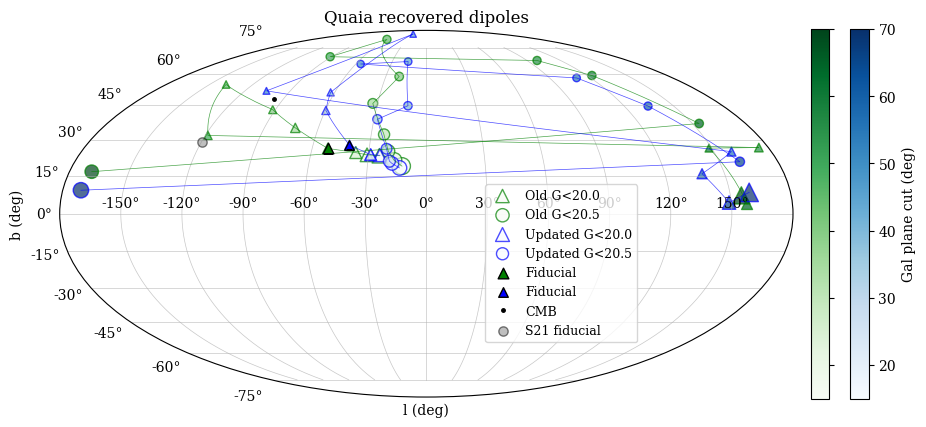

In [69]:
# sky plot
fig = plt.figure(figsize=(12,6))
ax = plt.subplot(111, projection='mollweide')

# old
c = 'g'
ax.plot(Angle(dips_b_old[:,1], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
                Angle(dips_b_old[:,2], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
                marker='None', c=c, lw=0.5, **kwargs)
bim = ax.scatter(Angle(dips_b_old[:,1], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
                 Angle(dips_b_old[:,2], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
                 s=a*dips_b_old[:,0], marker='^',
                 c=b_smap_old.to_rgba(blims), edgecolors=c, label='Old G<20.0', **kwargs)
ax.plot(Angle(dips_b_old_low[:,1], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
                Angle(dips_b_old_low[:,2], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
                marker='None', c=c, lw=0.5, **kwargs)
bim = ax.scatter(Angle(dips_b_old_low[:,1], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
                 Angle(dips_b_old_low[:,2], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
                 s=a*dips_b_old_low[:,0], marker='o',
                 c=b_smap_old.to_rgba(blims), edgecolors=c, label='Old G<20.5', **kwargs)
# updated
c = 'b'
ax.plot(Angle(dips_b[:,1], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
                Angle(dips_b[:,2], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
                marker='None', c=c, lw=0.5, **kwargs)
bim = ax.scatter(Angle(dips_b[:,1], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
                 Angle(dips_b[:,2], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
                 s=a*dips_b[:,0], marker='^',
                 c=b_smap.to_rgba(blims), edgecolors=c, label='Updated G<20.0', **kwargs)
ax.plot(Angle(dips_b_low[:,1], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
                Angle(dips_b_low[:,2], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
                marker='None', c=c, lw=0.5, **kwargs)
bim = ax.scatter(Angle(dips_b_low[:,1], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
                 Angle(dips_b_low[:,2], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
                 s=a*dips_b_low[:,0], marker='o',
                 c=b_smap.to_rgba(blims), edgecolors=c, label='Updated G<20.5', **kwargs)

# Quaia fiducial
i_fid = np.where(blims==30.)[0]
print(dips_b_old[i_fid])
ax.scatter(Angle(dips_b_old[i_fid,1], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
           Angle(dips_b_old[i_fid,2], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
           marker='^', c='g', edgecolors='k', s=a*dips_b_old[i_fid,0],
        zorder=10, label='Fiducial')
print(dips_b[i_fid])
ax.scatter(Angle(dips_b[i_fid,1], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
           Angle(dips_b[i_fid,2], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
           marker='^', c='b', edgecolors='k', s=a*dips_b[i_fid,0],
            zorder=10, label='Fiducial')
# CMB
ax.plot(Angle(cmb_dir.l, unit=u.rad).wrap_at(np.pi*u.rad),
        Angle(cmb_dir.b, unit=u.rad).wrap_at(np.pi*u.rad),
        marker='o', ls='None', ms=500*0.005, alpha=1., c='k', zorder=11, label='CMB')
# S21 fiducial
ax.scatter(Angle(S21_fid[1]*u.deg).to(u.rad).wrap_at(np.pi*u.rad),
           Angle(S21_fid[2]*u.deg).to(u.rad).wrap_at(np.pi*u.rad),
           marker='o', c='grey', alpha=0.5, edgecolors='k', s=a*S21_fid[0], zorder=10, label='S21 fiducial')

ax.set_xlabel('l (deg)')
ax.set_ylabel('b (deg)')
ax.legend(loc=(.58,.15), fontsize=9)
fig.colorbar(b_smap, ax=ax, pad=-.1, shrink=0.8, label='Gal plane cut (deg)')
cbar = fig.colorbar(b_smap_old, ax=ax, pad=0.02, shrink=0.8)
cbar.ax.set_yticklabels([])
ax.set_title('Quaia recovered dipoles')
ax.grid(True, lw=0.5, alpha=0.7)

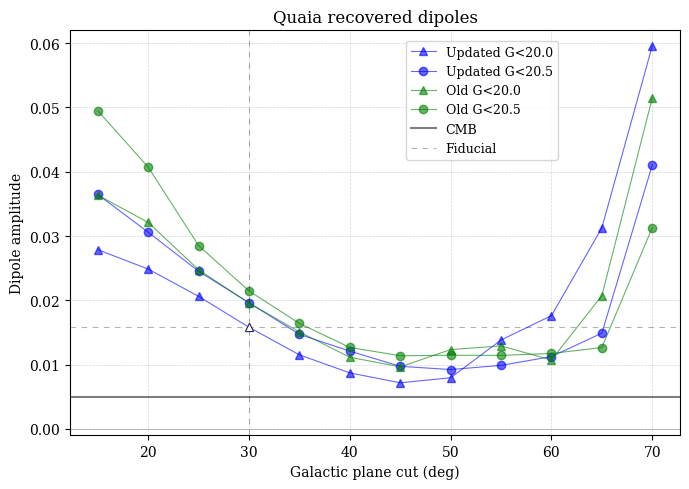

In [33]:
# amplitudes
# amplitudes
fig, ax = plt.subplots(figsize=(7,5))

kwargs = dict(lw=0.8, ms=6, alpha=0.6) # color='w', markerfacecolor='None')

ax.plot(blims, dips_b[:,0], c='b', marker='^', label='Updated G<20.0', **kwargs)
ax.plot(blims, dips_b_low[:,0], c='b', marker='o', label='Updated G<20.5', **kwargs)
ax.plot(blims, dips_b_old[:,0], c='g', marker='^', label='Old G<20.0', **kwargs)
ax.plot(blims, dips_b_old_low[:,0], c='g', marker='o', label='Old G<20.5', **kwargs)

ax.set_xlabel('Galactic plane cut (deg)')
ax.axvline(30., alpha=0.3, c='k', ls=(0,(5,5)), lw=0.8)
ax.plot(30., dips_b[:,0][blims==30.], marker='^', c='w', mec='k', mew=0.5, zorder=10)

ax.grid(lw=0.5, alpha=0.5, ls='--')
ax.axhline(0.005, c='k', label='CMB', alpha=0.5, lw=1.5)
ax.set_ylabel('Dipole amplitude')
ax.set_ylim(-.001, 0.062)
ax.axhline(0, alpha=0.3, color='k', lw=0.5)
ax.axhline(dips_b[:,0][blims==30.], alpha=0.3, c='k', ls=(0,(5,5)), lw=0.8, label='Fiducial')
ax.set_title('Quaia recovered dipoles')
ax.legend(loc=(0.55,0.68), fontsize=9)
fig.tight_layout()

### galactic plane cuts

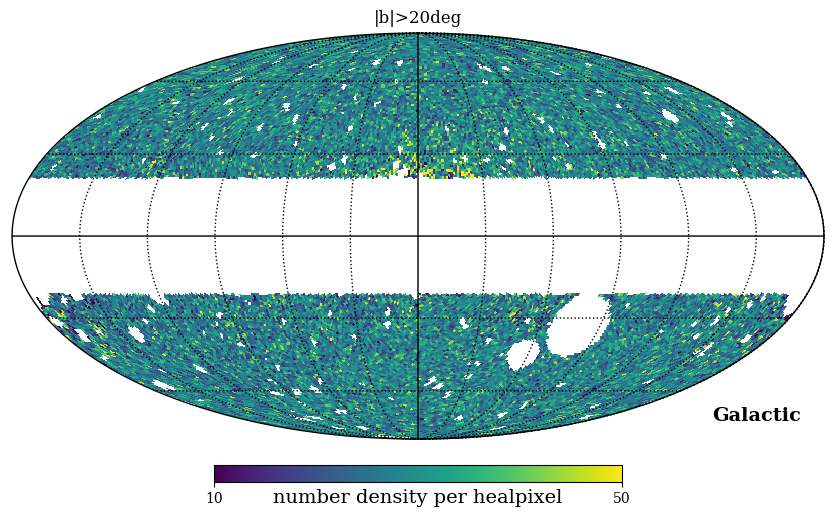

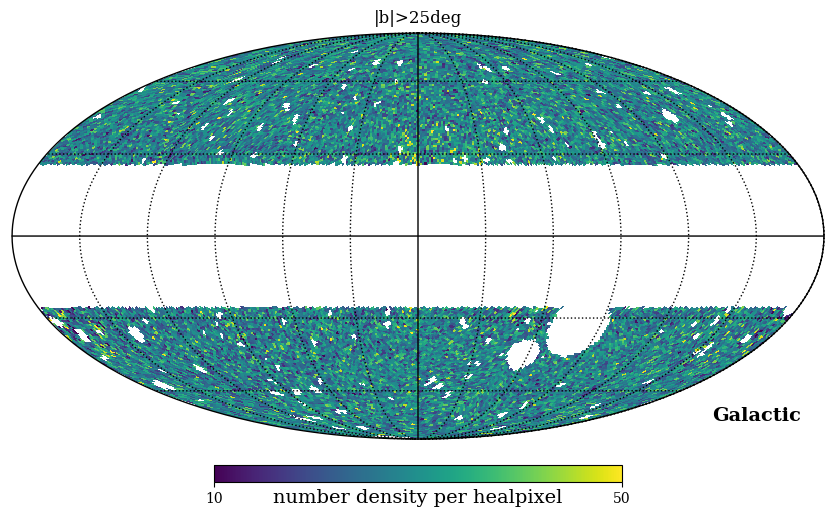

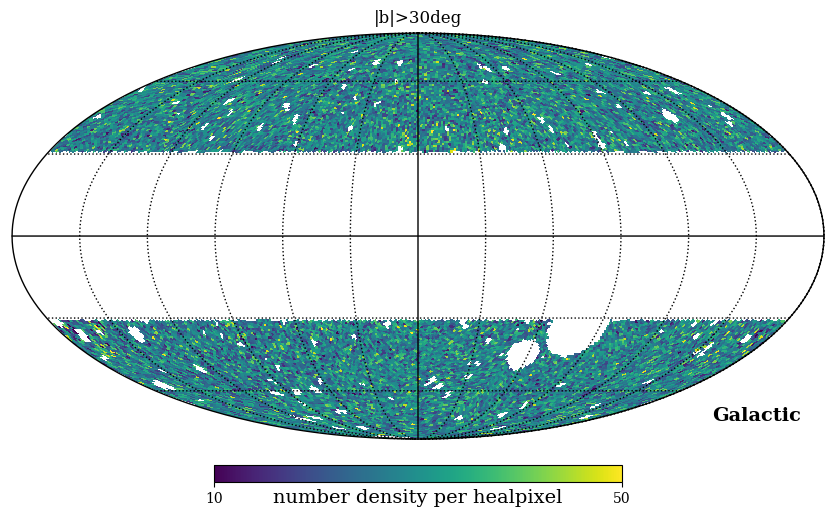

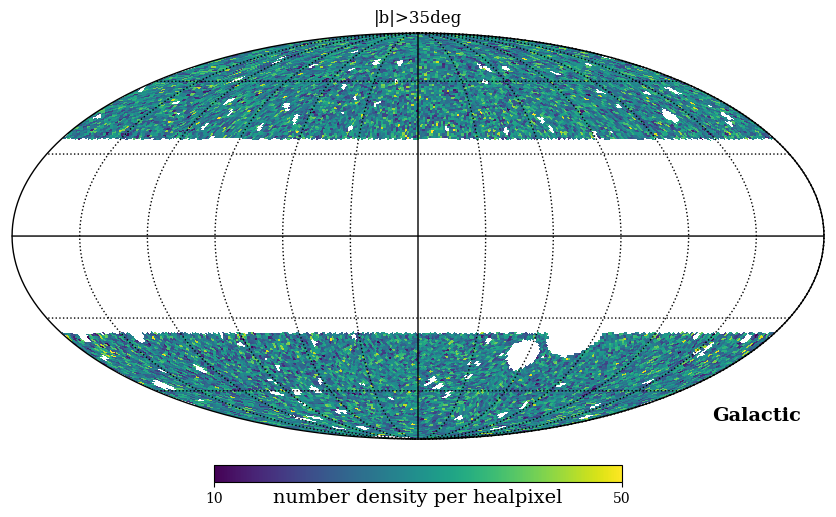

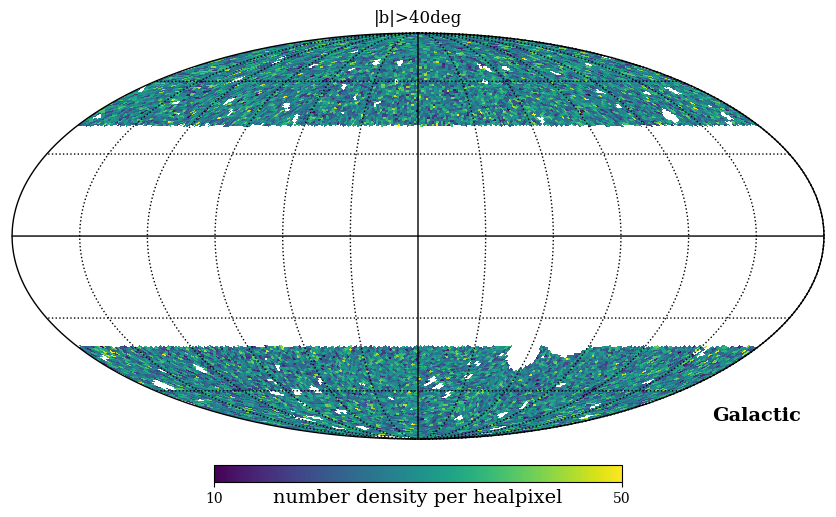

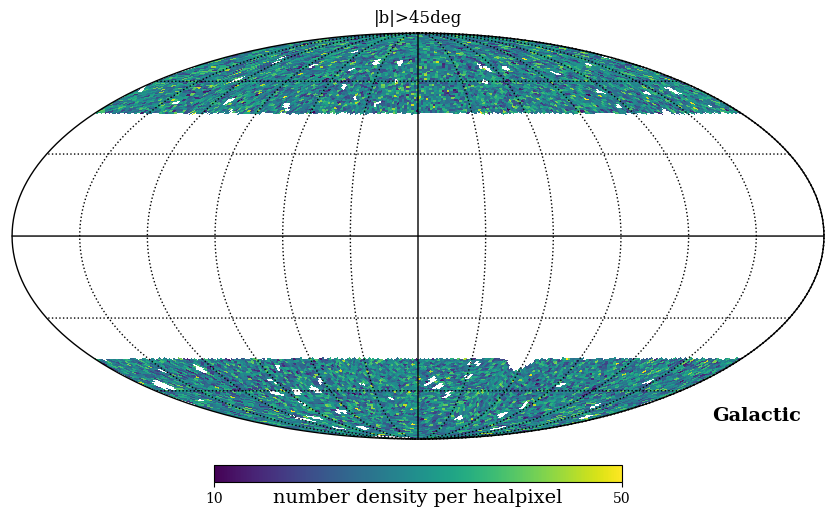

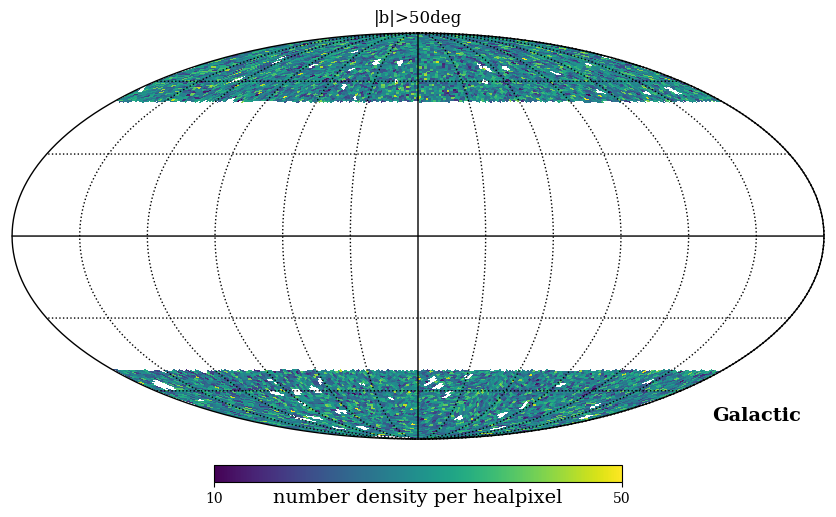

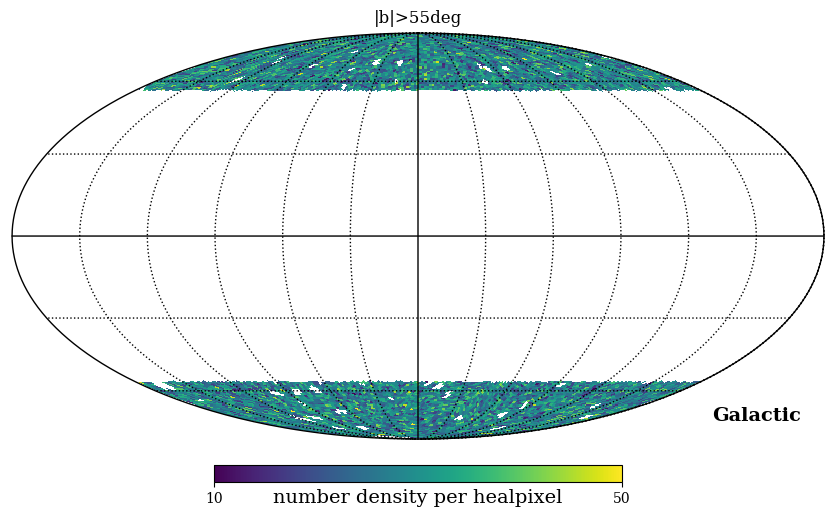

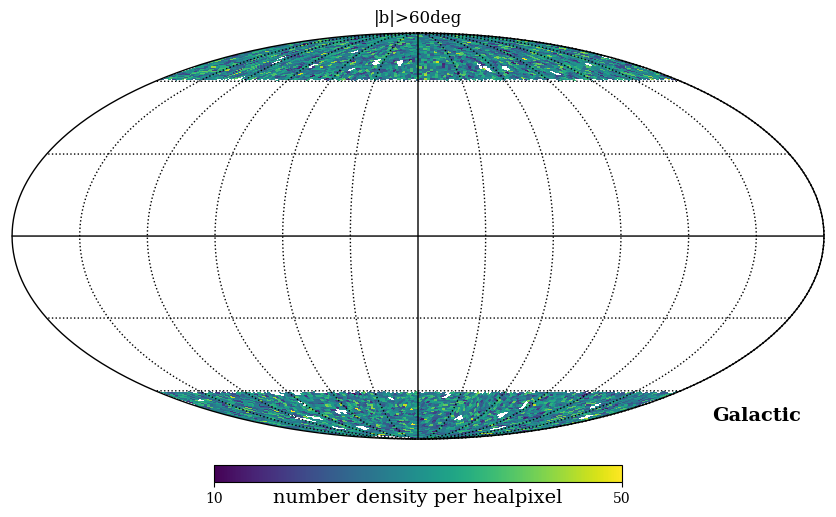

In [70]:
blims = np.arange(20, 61, 5)
dipoles_bcut = []
for i, blim in enumerate(blims):
    d = SecrestDipole(blim=blim, save_tag='', maglim=20., **quaia_kwargs)
    map_ = d.load_hpxelatcorr()
    d.plot_map(map_, min=10, max=50, title=f'|b|>{blim}deg')
    dipoles_bcut.append(d.compute_dipole(map_))

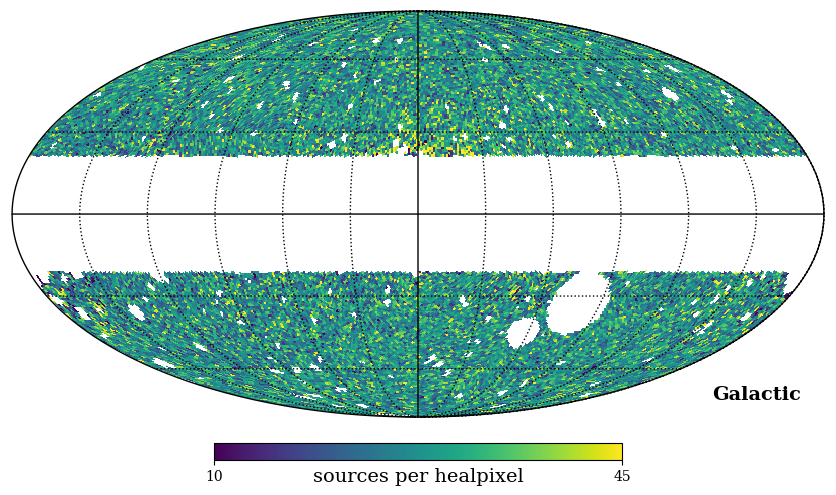

In [71]:
# nice plot of fiducial catalog
d = SecrestDipole(blim=20, save_tag='', maglim=20., **quaia_kwargs)
map_ = np.empty(49152)
map_[:] = np.nan
tab = d.load_hpxelatcorr()
map_[tab['hpidx']] = tab['elatdenscorr']
hp.mollview(map_, coord=['C','G'], min=10, max=45, badcolor='w', title='', unit='sources per healpixel')
hp.graticule()

### masking radius

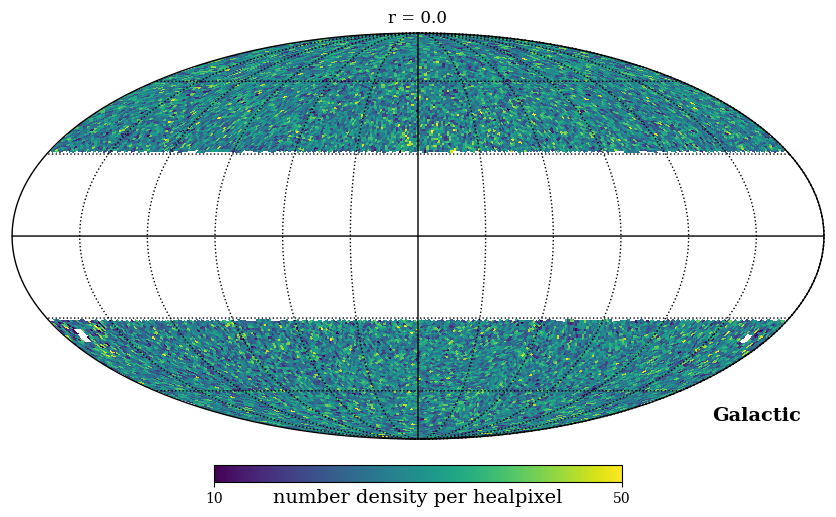

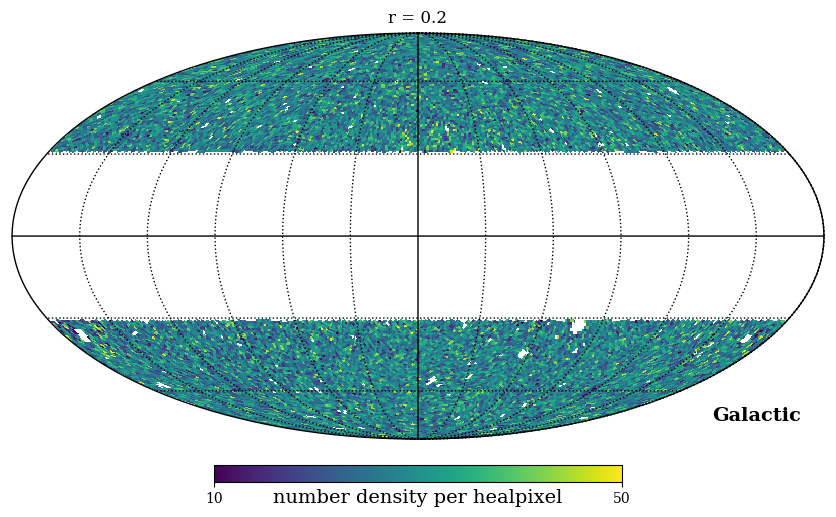

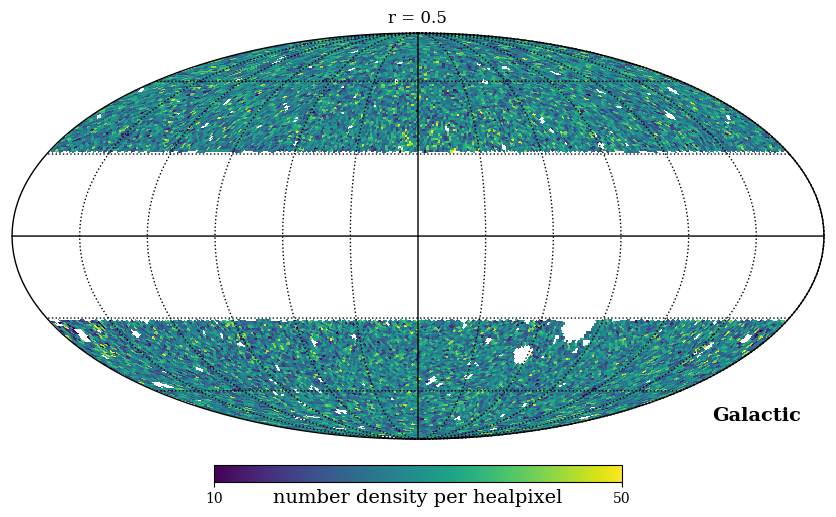

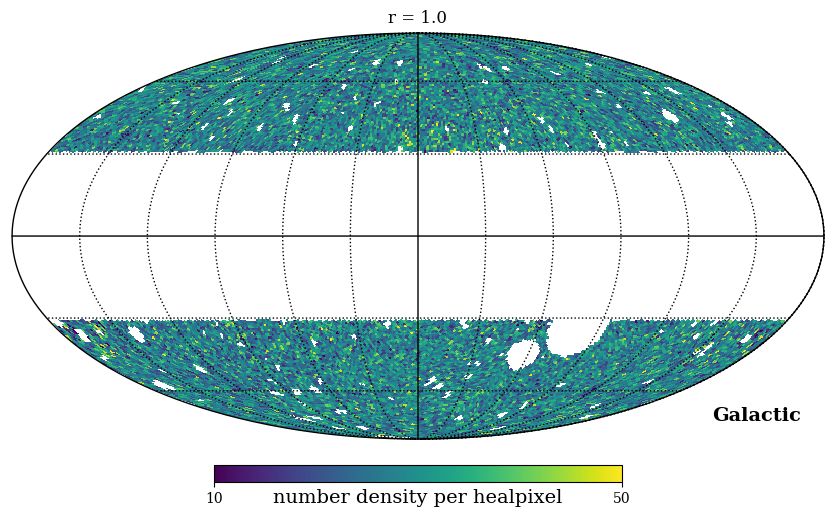

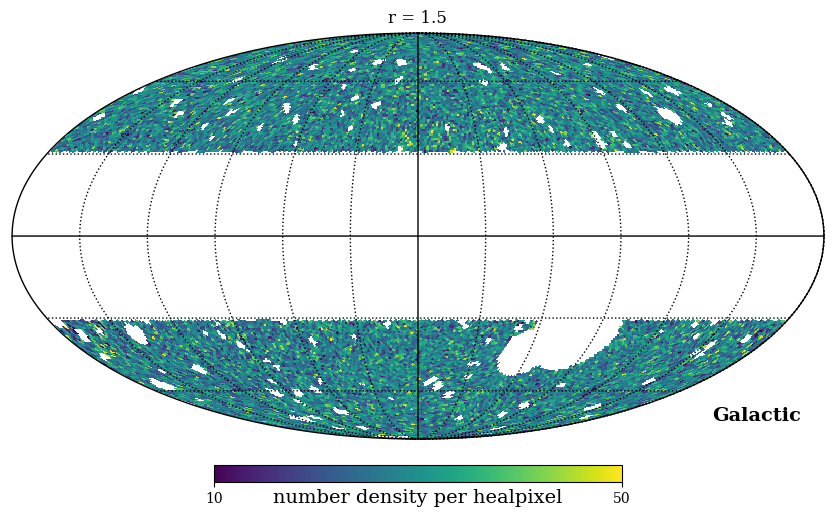

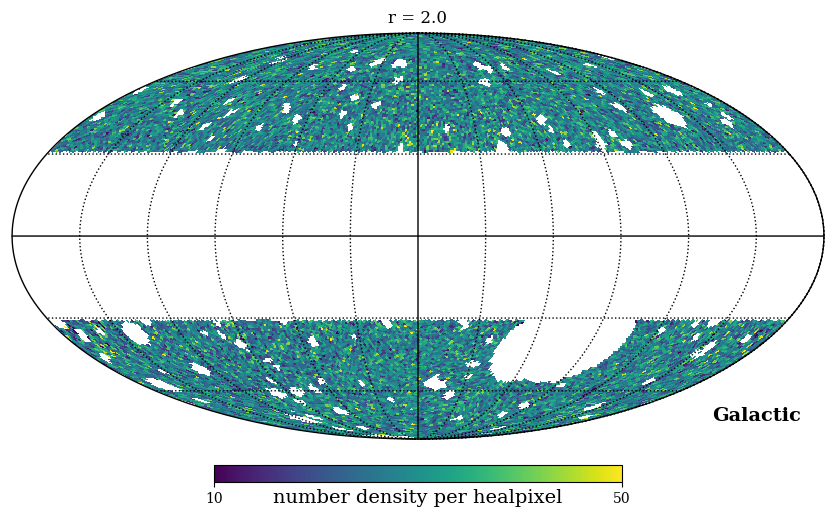

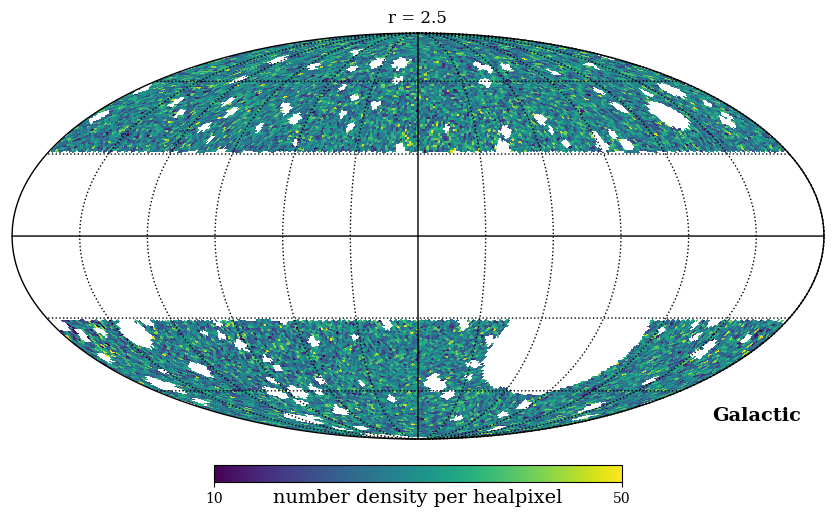

In [72]:
factors = np.array([0., 0.2, 0.5, 1., 1.5, 2., 2.5])
dipoles_masks = []
for i, factor in enumerate(factors):
    save_tag = f'_r{factor:.1f}'
    d = SecrestDipole(save_tag=save_tag, maglim=20., **quaia_kwargs)
    map_ = d.load_hpxelatcorr()
    d.plot_map(map_, min=10, max=50, title=f'r = {factor}')
    dipoles_masks.append(d.compute_dipole(map_))

### magnitude limits

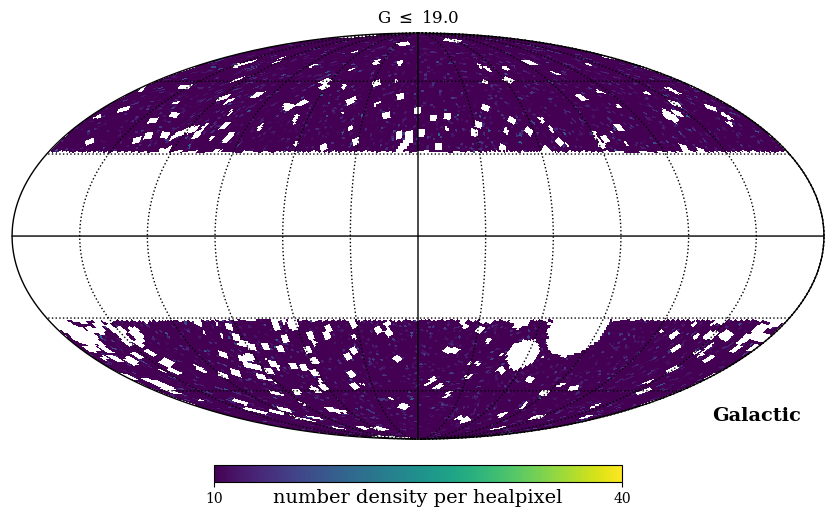

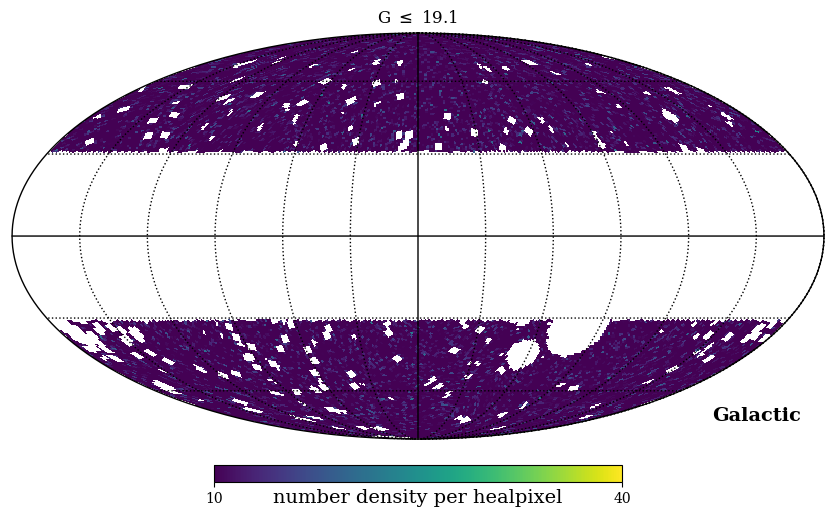

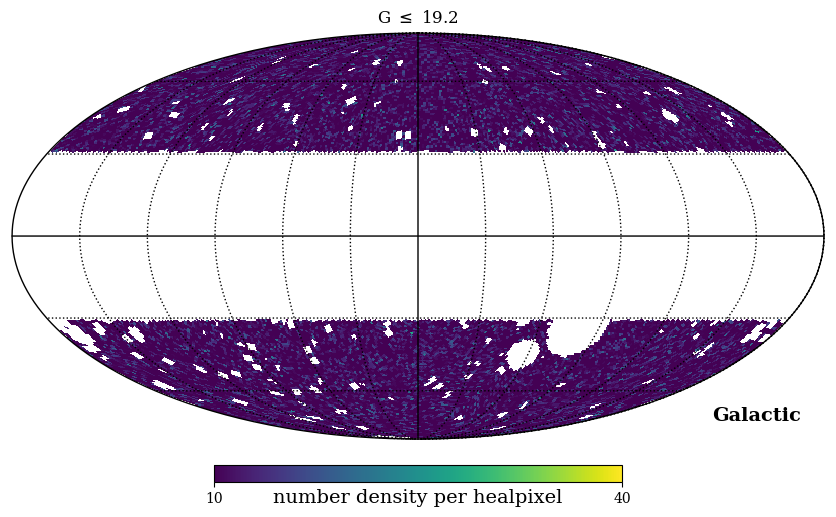

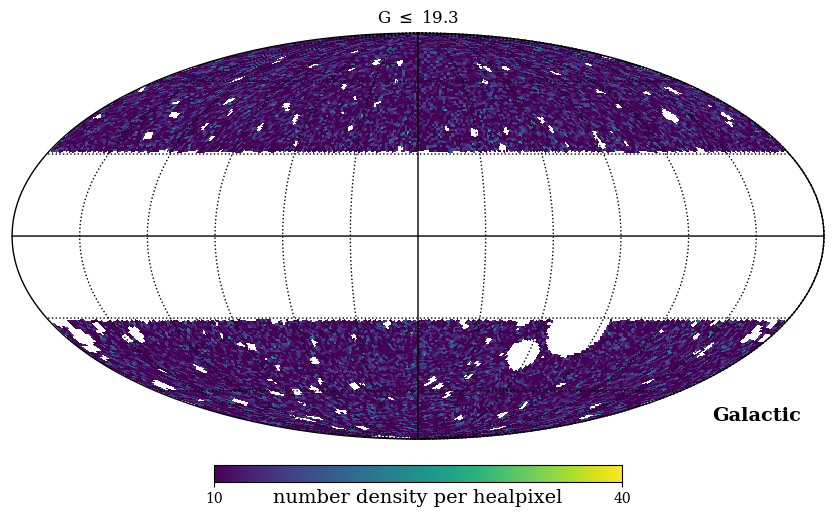

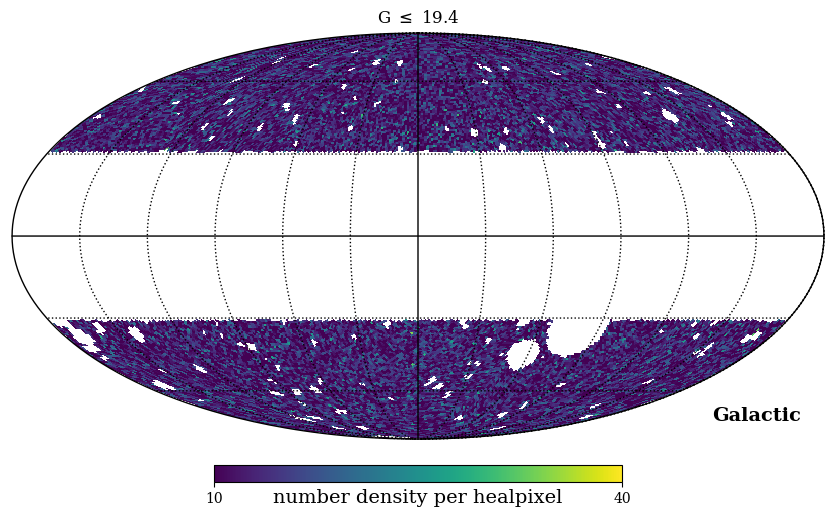

...

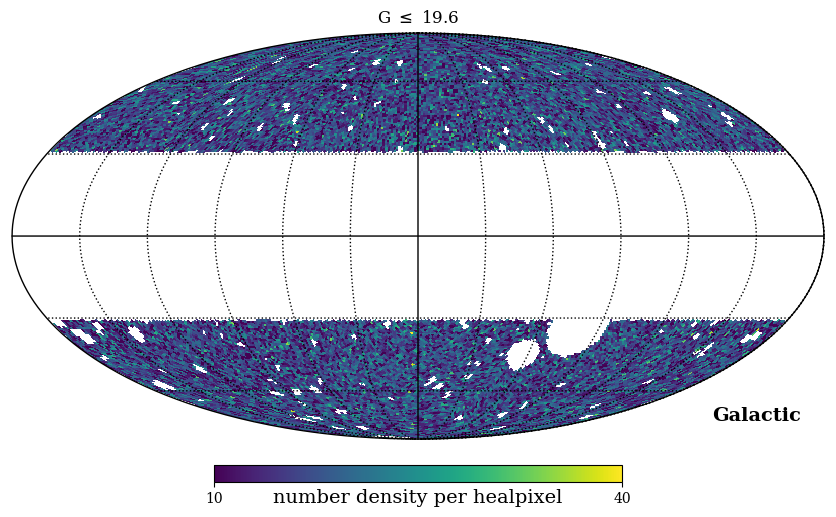

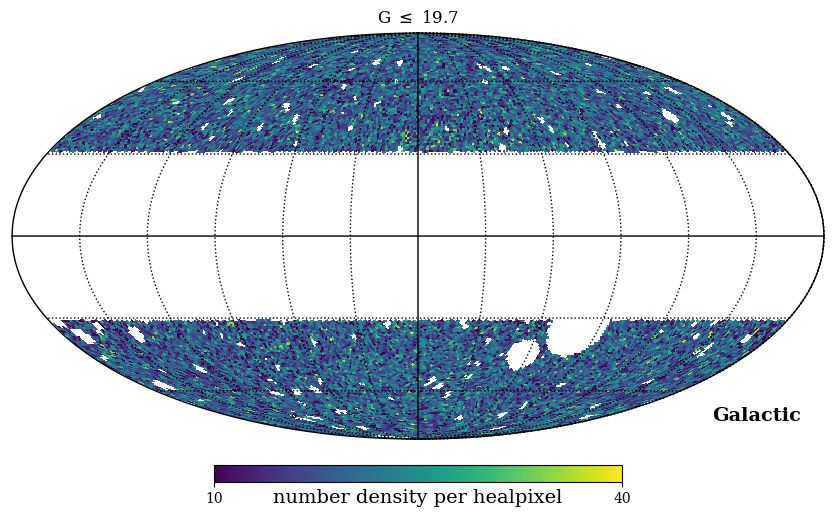

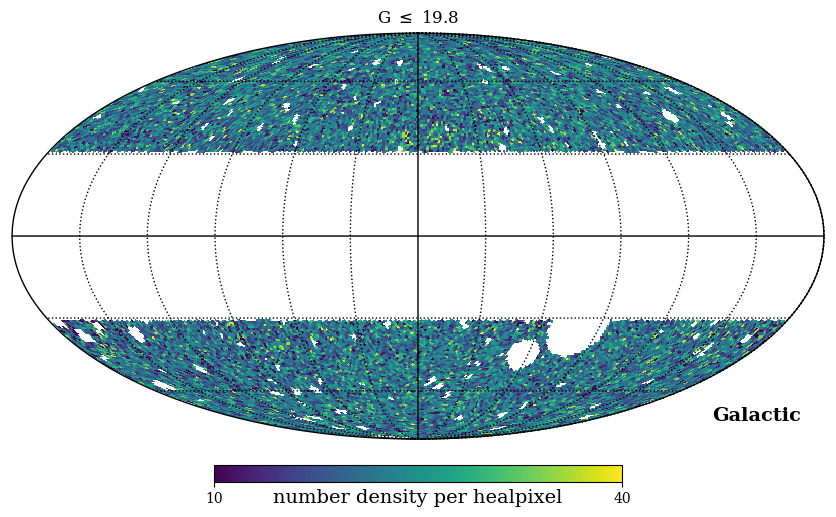

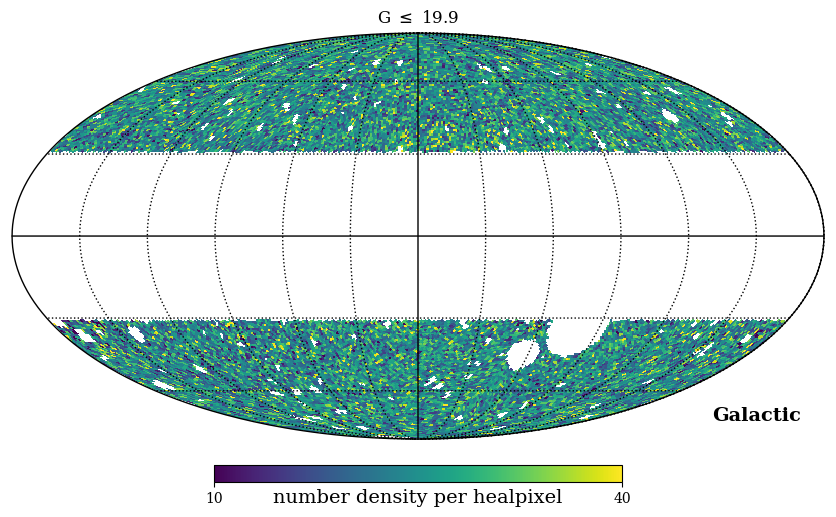

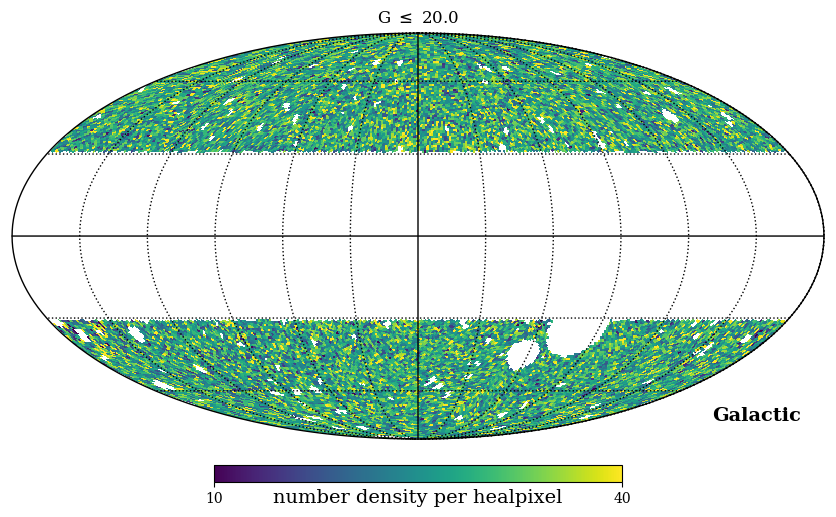

In [73]:
maglims = np.arange(19., 20.01, 0.1)
dipoles_maglims = []
for i, maglim in enumerate(maglims):
    d = SecrestDipole(maglim=maglim, **quaia_kwargs)
    map_ = d.load_hpxelatcorr()
    d.plot_map(map_, title=f'G $\leq$ {maglim:.1f}', min=10, max=40)
    dipoles_maglims.append(d.compute_dipole(map_))

In [74]:
dips_b = np.array([
    [x[0], x[1].l.deg, x[1].b.deg] for x in dipoles_bcut
])
dips_masks = np.array([
    [x[0], x[1].l.deg, x[1].b.deg] for x in dipoles_masks
])
dips_maglims = np.array([
    [x[0], x[1].l.deg, x[1].b.deg] for x in dipoles_maglims
])

In [75]:
b_smap = mpl.cm.ScalarMappable(cmap='Blues',norm = mpl.colors.Normalize(vmin=min(blims), vmax=max(blims)))
r_smap = mpl.cm.ScalarMappable(cmap='Reds',norm = mpl.colors.Normalize(vmin=min(factors), vmax=max(factors)))
g_smap = mpl.cm.ScalarMappable(cmap='Greens',norm = mpl.colors.Normalize(vmin=min(maglims), vmax=max(maglims)))

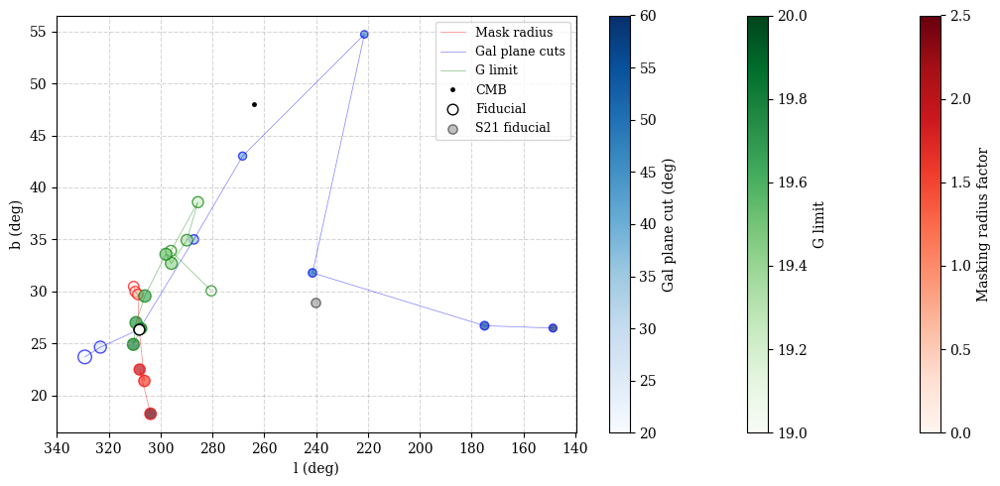

In [76]:
fig, ax = plt.subplots(figsize=(11,5))

kwargs = dict(marker='o', alpha=0.7) # color='w', markerfacecolor='None')
a = 3000

# mask radii
ax.plot(dips_masks[:,1], dips_masks[:,2], c='r', label='Mask radius', **line_kwargs) # b_smap.to_rgba(blims[i]))
rim = ax.scatter(dips_masks[:,1], dips_masks[:,2], s=a*dips_masks[:,0], c=r_smap.to_rgba(factors),
           edgecolors='r', **kwargs)
# galactic plane
ax.plot(dips_b[:,1], dips_b[:,2], c='b', label='Gal plane cuts', **line_kwargs) # b_smap.to_rgba(blims[i]))
bim = ax.scatter(dips_b[:,1], dips_b[:,2], s=a*dips_b[:,0], c=b_smap.to_rgba(blims), edgecolors='b', **kwargs)
# magnitude limit
ax.plot(dips_maglims[:,1], dips_maglims[:,2], c='g', label='G limit', **line_kwargs) # b_smap.to_rgba(blims[i]))
w1im = ax.scatter(dips_maglims[:,1], dips_maglims[:,2], s=a*dips_maglims[:,0], c=g_smap.to_rgba(maglims),
           edgecolors='g', **kwargs)
# CMB
ax.plot(cmb_dir.l.deg, cmb_dir.b.deg, marker='o', ls='None', ms=500*0.005, alpha=1., c='k', zorder=11, label='CMB')
# Quaia fiducial
i_fid = np.where(blims==30.)[0]
ax.scatter(dips_b[i_fid,1], dips_b[i_fid,2], marker='o', c='w', edgecolors='k', s=a*dips_b[i_fid,0],
        zorder=10, label='Fiducial')
# S21 fiducial
ax.scatter(S21_fid[1], S21_fid[2], marker='o', c='grey', alpha=0.5, edgecolors='k', s=a*S21_fid[0],
        zorder=10, label='S21 fiducial')

ax.grid(alpha=0.5, ls='--')
ax.invert_xaxis()
xticks = np.arange(140,341,20)
ax.set_xticks(xticks)
ax.set_xlabel('l (deg)')
ax.set_ylabel('b (deg)')
ax.legend(loc=0, fontsize=9)
fig.colorbar(r_smap, ax=ax, label='Masking radius factor')
fig.colorbar(g_smap, ax=ax, label='G limit')
fig.colorbar(b_smap, ax=ax, label='Gal plane cut (deg)')
fig.tight_layout()

In [ ]:
# sky plot
fig = plt.figure(figsize=(10,5))
ax = plt.subplot(111, projection='mollweide')

line_kwargs = dict(alpha=0.5, lw=0.5, marker='None')
kwargs = dict(marker='o', alpha=0.7) # color='w', markerfacecolor='None')
a = 3000

# mask radii
ax.plot(Angle(dips_masks[:,1], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
        Angle(dips_masks[:,2], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
        c='r', label='Mask radius', **line_kwargs)
rim = ax.scatter(Angle(dips_masks[:,1], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
                 Angle(dips_masks[:,2], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
                 s=a*dips_masks[:,0], c=r_smap.to_rgba(factors), edgecolors='r', **kwargs)

# magnitude limit
ax.plot(Angle(dips_maglims[:,1], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
        Angle(dips_maglims[:,2], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
        c='g', label='W1 limit', **line_kwargs)
w1im = ax.scatter(Angle(dips_maglims[:,1], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
                  Angle(dips_maglims[:,2], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
                  s=a*dips_maglims[:,0], c=w1_smap.to_rgba(maglims), edgecolors='g', **kwargs)
# galactic plane
ax.plot(Angle(dips_b[:,1], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
        Angle(dips_b[:,2], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
        c='b', label='Gal plane cuts', **line_kwargs)
bim = ax.scatter(Angle(dips_b[:,1], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
                 Angle(dips_b[:,2], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
                 s=a*dips_b[:,0], c=b_smap.to_rgba(blims), edgecolors='b', **kwargs)

# CMB
ax.plot(Angle(cmb_dir.l, unit=u.rad).wrap_at(np.pi*u.rad),
        Angle(cmb_dir.b, unit=u.rad).wrap_at(np.pi*u.rad),
        marker='o', ls='None', ms=500*0.005, alpha=1., c='k', zorder=11, label='CMB')
# Quaia fiducial
i_fid = np.where(blims==30.)[0]
ax.scatter(Angle(dips_b[i_fid,1], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
           Angle(dips_b[i_fid,2], unit='deg').to(u.rad).wrap_at(np.pi*u.rad),
           marker='^', c='b', edgecolors='k', s=a*dips_b[i_fid,0],
            zorder=10, label='Fiducial')
# S21 fiducial
ax.scatter(Angle(S21_fid[1]*u.deg).to(u.rad).wrap_at(np.pi*u.rad),
           Angle(S21_fid[2]*u.deg).to(u.rad).wrap_at(np.pi*u.rad),
           marker='o', c='w', edgecolors='k', s=a*S21_fid[0], zorder=10, label='S21 fiducial')

ax.set_xlabel('l (deg)')
ax.set_ylabel('b (deg)')
ax.legend(loc=(.58,.15), fontsize=9)
cbar_kwargs = dict(shrink=0.65, aspect=30, fraction=.15)
fig.colorbar(r_smap, ax=ax, pad=-.04, label='Masking radius factor', **cbar_kwargs)
fig.colorbar(w1_smap, ax=ax, pad=-.03, label='G limit', **cbar_kwargs)
fig.colorbar(b_smap, ax=ax, pad=.02, label='Gal plane cut (deg)', **cbar_kwargs)
# ax.set_title('S21 recovered dipoles')
ax.grid(True, lw=0.5, alpha=0.7)
fig.tight_layout()

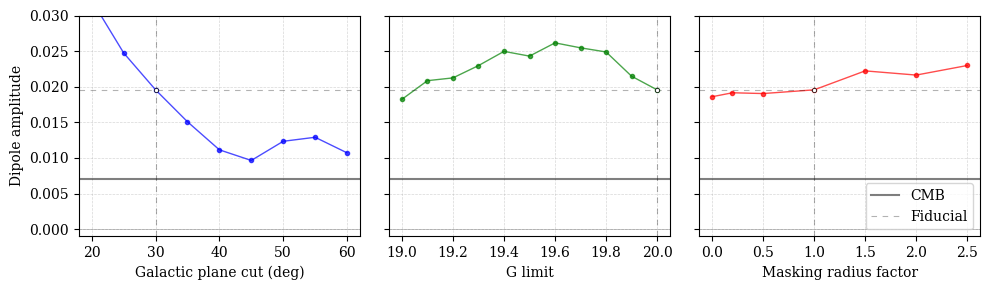

In [33]:
# amplitudes
fig, axs = plt.subplots(1, 3, figsize=(10,3))

kwargs = dict(lw=1, alpha=0.7, marker='.') # color='w', markerfacecolor='None')

# galactic plane
axs[0].plot(blims, dips_b[:,0], c='b', **kwargs)
axs[0].set_xlabel('Galactic plane cut (deg)')
axs[0].axvline(30., alpha=0.3, c='k', ls=(0,(5,5)), lw=0.8)
axs[0].plot(30., dips_b[:,0][blims==30.], marker='.', c='w', mec='k', mew=0.5, zorder=10)
# magnitude limit
axs[1].plot(maglims, dips_maglims[:,0], c='g', **kwargs)
axs[1].set_xlabel('G limit')
axs[1].axvline(20., alpha=0.3, c='k', ls=(0,(5,5)), lw=0.8)
axs[1].plot(20., dips_maglims[:,0][-1], marker='.', c='w', mec='k', mew=0.5, zorder=10)
# mask radii
axs[2].plot(factors, dips_masks[:,0], c='r', **kwargs)
axs[2].set_xlabel('Masking radius factor')
axs[2].axvline(1., alpha=0.3, c='k', ls=(0,(5,5)), lw=0.8)
axs[2].plot(1., dips_masks[:,0][factors==1.], marker='.', c='w', mec='k', mew=0.5, zorder=10)

# CMB and other formatting
for ax in axs:
    ax.grid(lw=0.5, alpha=0.5, ls='--')
    ax.axhline(cmb_amp, c='k', label='CMB', alpha=0.5, lw=1.5)
    ax.set_ylim(-.001, 0.03)
    ax.axhline(0, alpha=0.3, color='k', lw=0.5)
    ax.axhline(dips_b[i_fid][:,0], alpha=0.3, c='k', ls=(0,(5,5)), lw=0.8, label='Fiducial')
for ax in axs[1:]:
    ax.set_yticklabels([])
axs[0].set_ylabel('Dipole amplitude')
axs[-1].legend(loc=4)
fig.tight_layout()

### angle to CMB

In [34]:
angles_blims = angletoCMB(dips_b)
angles_maglims = angletoCMB(dips_maglims)
angles_masks = angletoCMB(dips_masks)

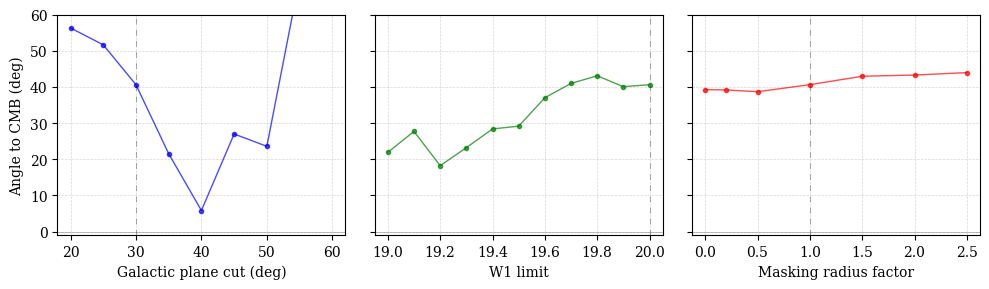

In [35]:
# amplitudes
fig, axs = plt.subplots(1, 3, figsize=(10,3))

kwargs = dict(lw=1, alpha=0.7, marker='.')

# galactic plane
axs[0].plot(blims, angles_blims, c='b', **kwargs)
axs[0].set_xlabel('Galactic plane cut (deg)')
axs[0].axvline(30, alpha=0.3, c='k', ls=(0,(5,5)), lw=0.8)
# axs[0].plot(30, dips_b[:,0][blims==30], marker='.', c='w', mec='k', mew=0.5, zorder=10)
# magnitude limit
axs[1].plot(maglims, angles_maglims, c='g', **kwargs)
axs[1].set_xlabel('W1 limit')
axs[1].axvline(20., alpha=0.3, c='k', ls=(0,(5,5)), lw=0.8)
# axs[1].plot(16.4, dips_maglims[:,0][maglims==16.4], marker='.', c='w', mec='k', mew=0.5, zorder=10)
# mask radii
axs[2].plot(factors, angles_masks, c='r', **kwargs)
axs[2].set_xlabel('Masking radius factor')
axs[2].axvline(1., alpha=0.3, c='k', ls=(0,(5,5)), lw=0.8)
# axs[2].plot(1., dips_masks[:,0][factors==1.], marker='.', c='w', mec='k', mew=0.5, zorder=10)

# CMB and other formatting
for ax in axs:
    ax.grid(lw=0.5, alpha=0.5, ls='--')
    # ax.axhline(cmb_amp, c='k', label='CMB', alpha=0.5, lw=1.5)
    ax.set_ylim(-1, 60)
    ax.axhline(0, alpha=0.3, color='k', lw=0.5)
    # ax.axhline(S21_fid[0], alpha=0.3, c='k', ls=(0,(5,5)), lw=0.8, label='Fiducial')
for ax in axs[1:]:
    ax.set_yticklabels([])
axs[0].set_ylabel('Angle to CMB (deg)')
# axs[-1].legend()
fig.tight_layout()

### finer grid of plane cuts

In [36]:
res = np.load('/scratch/aew492/quasars/catalogs/quaia/dipoles_blimgrid.npy', allow_pickle=True)
blims, dip_amps, dip_dirs = res.T
blims = blims.astype(float)
dip_amps = dip_amps.astype(float)
dip_dirs = np.array([
    (x.galactic.l.deg, x.galactic.b.deg) for x in dip_dirs
])
b_smap = mpl.cm.ScalarMappable(cmap='Blues',norm = mpl.colors.Normalize(vmin=min(blims), vmax=max(blims)))

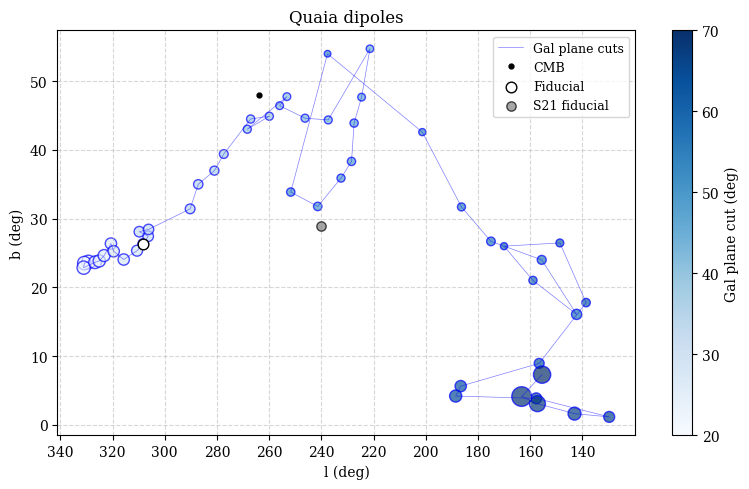

In [37]:
fig, ax = plt.subplots(figsize=(8,5))
kwargs = dict(marker='o', alpha=0.7)
ax.plot(dip_dirs[:,0], dip_dirs[:,1], c='b', label='Gal plane cuts', **line_kwargs)
bim = ax.scatter(dip_dirs[:,0], dip_dirs[:,1], s=a*dip_amps, c=b_smap.to_rgba(blims), edgecolors='b', **kwargs)

# CMB
ax.plot(cmb_dir.l.deg, cmb_dir.b.deg, marker='o', ls='None', ms=500*cmb_amp, alpha=1., c='k', zorder=11, label='CMB')
# Quaia fiducial
i_fid = np.where(blims==30.)[0]
ax.scatter(dip_dirs[i_fid,0], dip_dirs[i_fid,1], marker='o', c='w', edgecolors='k', s=a*dip_amps[i_fid],
        zorder=10, label='Fiducial')
# S21 fiducial
ax.scatter(S21_fid[1], S21_fid[2], marker='o', c='grey', alpha=0.7, edgecolors='k', s=a*S21_fid[0],
        zorder=10, label='S21 fiducial')

ax.grid(alpha=0.5, ls='--')
ax.invert_xaxis()
xticks = np.arange(140,341,20)
ax.set_xticks(xticks)
ax.set_xlabel('l (deg)')
ax.set_ylabel('b (deg)')
ax.legend(loc=0, fontsize=9)
ax.set_title('Quaia dipoles')
fig.colorbar(b_smap, ax=ax, label='Gal plane cut (deg)')
fig.tight_layout()

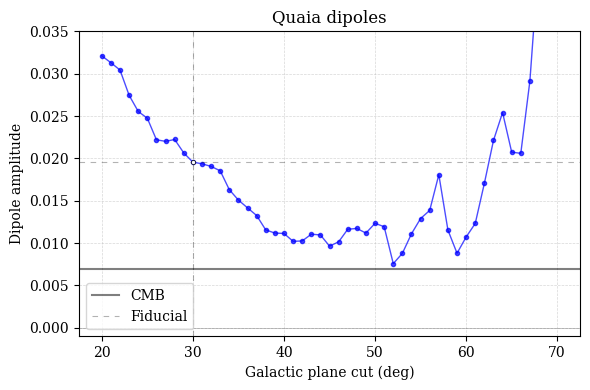

In [39]:
# amplitudes
fig, ax = plt.subplots(figsize=(6,4))

kwargs = dict(lw=1, alpha=0.7, marker='.')

ax.plot(blims, dip_amps, c='b', **kwargs)
ax.set_xlabel('Galactic plane cut (deg)')
ax.axvline(30., alpha=0.3, c='k', ls=(0,(5,5)), lw=0.8)
ax.plot(30., dip_amps[blims==30.], marker='.', c='w', mec='k', mew=0.5, zorder=10)

ax.grid(lw=0.5, alpha=0.5, ls='--')
ax.axhline(cmb_amp, c='k', label='CMB', alpha=0.5, lw=1.5)
ax.set_ylabel('Dipole amplitude')
ax.set_ylim(-.001, 0.035)
ax.axhline(0, alpha=0.3, color='k', lw=0.5)
ax.axhline(dip_amps[blims==30.], alpha=0.3, c='k', ls=(0,(5,5)), lw=0.8, label='Fiducial')
ax.legend(loc=3)
ax.set_title('Quaia dipoles')
fig.tight_layout()

### angle to the CMB

### grid of `blims` and `maglims`

#### Catwise

In [40]:
blims = np.arange(20, 61, 10)
maglims = np.arange(15.8, 16.81, 0.2)
dipole_grid = np.empty((len(blims), len(maglims), 4))
dipole_grid_amps = np.empty((len(blims), len(maglims)))
for i, blim in enumerate(blims):
    for j, maglim in enumerate(maglims):
        d = SecrestDipole(blim=blim, save_tag='', maglim=maglim, **catwise_kwargs)
        map_ = d.load_hpxelatcorr()
        # d.plot_map(map_, min=10, max=50, title=f'|b|>{blim}deg')
        amps, _ = d.compute_dipole(map_)
        dipole_grid[i,j] = d.amps
        dipole_grid_amps[i,j] = amps

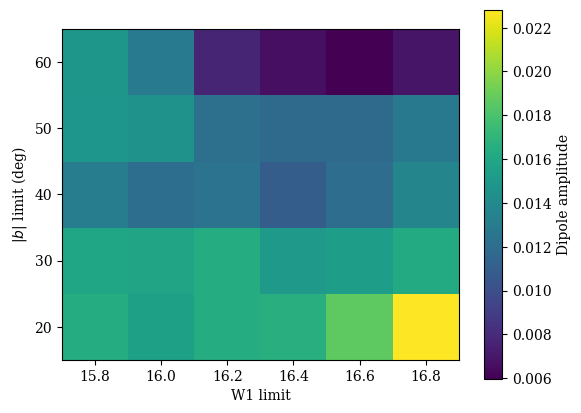

In [46]:
fig, ax = plt.subplots()
im = ax.imshow(dipole_grid_amps, origin='lower')
ax.set_xlabel('W1 limit')
ax.set_xticks(range(len(maglims)), labels=[f'{x:.1f}' for x in maglims])
ax.set_ylabel('$|b|$ limit (deg)')
ax.set_yticks(range(len(blims)), labels=blims)
fig.colorbar(im, ax=ax, label='Dipole amplitude')

### source density with ecliptic latitude

In [23]:
maglims = np.arange(15.7, 16.81, 0.1)
maps = np.empty((len(maglims),49152))
maps[:] = np.nan
for i, maglim in enumerate(maglims):
    d = SecrestDipole(maglim=maglim, **catwise_kwargs)
    map_ = d.load_hpxelatcorr()
    maps[i][map_['hpidx']] = map_['elatdenscorr']

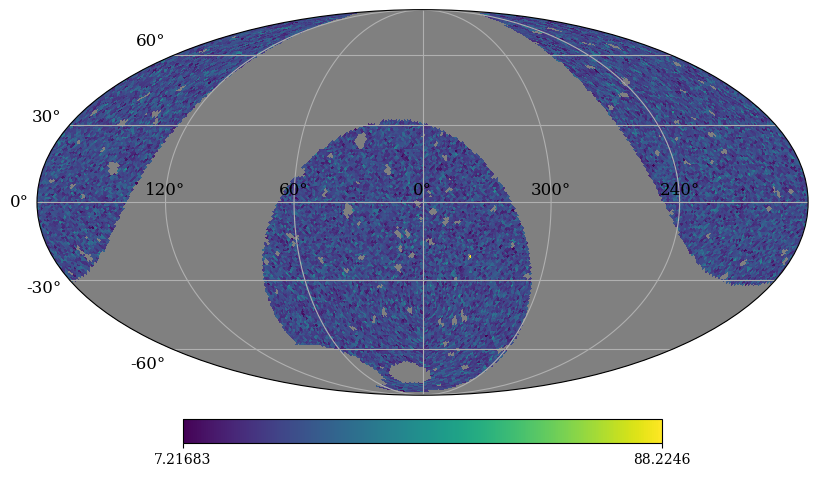

In [24]:
tools.plot_map(maps[0])